**last update: 08/27/2024**  

This notebook is for Bayesian Gaussian process regression test.

Dataset: 2*2 spatial average in latitude (4,6) longitude (36,38). CMIP6 annually, 1850 -2100. 13 models. Short-term oscillations(<10years) & mid-term oscillations(~30years). Consider long-term trend with KGCM.

Goal: Build a proper GPR model for virtual observations by self-designed process.

Design: Fine tune the hyperparameters and consider the evolving uncertainty with more observation years or different predictions with different observations.

Note: In this notebook, there is cross validation(leave-one-out) for 2 rounds(one for kernel structure's selection, one for hyperparameter tuning). 

1: Use the mean value of other models as prior, one model as the virtual observation and plot. Each model will be taken as the virtual observation once(1 round), and the total lml for all the models(all rounds) is used as the evaluation.

2: Use another 5 models from CMIP6(not included in training models) as virtual observations(as test). Use training as piror, fit the GPR to virtual observations and then calculate lml as evaluation.

# Package

In [1]:
import numpy as np
from sklearn.model_selection import GridSearchCV
from tqdm import tqdm
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ExpSineSquared, ConstantKernel as C
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV, ParameterGrid
from scipy.optimize import minimize
from pyswarm import pso
from bayes_opt import BayesianOptimization
from scipy.linalg import cholesky, cho_solve,cho_factor,solve_triangular
from scipy.signal import periodogram, welch
from scipy.fft import fft
from statsmodels.tsa.stattools import acf
from sklearn.gaussian_process.kernels import Kernel, WhiteKernel, Matern, RationalQuadratic as RQ, ConstantKernel as C
from sklearn.preprocessing import PolynomialFeatures
from sklearn.gaussian_process import GaussianProcessRegressor
import pywt
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, Matern, RationalQuadratic, DotProduct
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.graphics.tsaplots import plot_acf
from bayes_opt import BayesianOptimization, UtilityFunction
from properscoring import crps_gaussian
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
import matplotlib.cm as cm

# Data

In [2]:
rainfall = pd.read_csv('../data/CMIP5_sl/sl_annual_pr_1850-2099.csv')
rainfall = rainfall.set_index('years',drop=True)
rainfall.columns = [i+1 for i in range(rainfall.shape[1])]
rainfall_test = pd.read_csv('../data/CMIP5_sl/test_sl_annual_pr_1850-2099.csv')
rainfall_test = rainfall_test.set_index('years',drop=True)
rainfall_test.columns = [i+1 for i in range(rainfall_test.shape[1])]

In [3]:
rainfall_test

,1,2,3,4,5
years,,,,,
1850,370.093707,799.051011,845.882912,805.420122,308.689653
1851,470.173302,1180.320124,750.065067,1026.501760,120.971332
1852,431.992894,993.640702,433.894353,764.727677,305.525644
1853,462.609683,838.858434,643.227750,742.516874,383.780851
1854,228.148613,1763.167428,604.948462,1102.213979,417.198475
...,...,...,...,...,...
2095,592.164403,1358.894037,494.584827,1702.952990,422.773697
2096,653.838106,1153.307698,961.888290,1228.346561,203.833493
2097,465.003871,1314.801648,963.435967,1721.906534,471.546750


In [4]:
rainfall_yearly = rainfall.copy()

for column in rainfall.columns:
    # Filter data before 1950
    historical_data = rainfall.loc[rainfall.index < 1950, column]
    
    # Calculate mean and std
    mean_value = historical_data.mean()
    std_value = historical_data.std()
    
    # Standardize the column using mean and std
    rainfall_yearly[column] = (rainfall[column] - mean_value) / std_value
    
rainfall_yearly = rainfall_yearly.drop(columns=[5, 11, 16])
rainfall_yearly.columns = range(1, 14)
# Save the standardized data to a new CSV file
# export_path = "../data/CMIP5_s/scaled_s_annual_pr_1850-2100.csv"
# rainfall_yearly.to_csv(export_path)

In [5]:
rainfall_yearly_test = rainfall_test.copy()

for column in rainfall_test.columns:
    # Filter data before 1950
    historical_data = rainfall_test.loc[rainfall_test.index < 1950, column]
    
    # Calculate mean and std
    mean_value = historical_data.mean()
    std_value = historical_data.std()
    
    # Standardize the column using mean and std
    rainfall_yearly_test[column] = (rainfall_test[column] - mean_value) / std_value


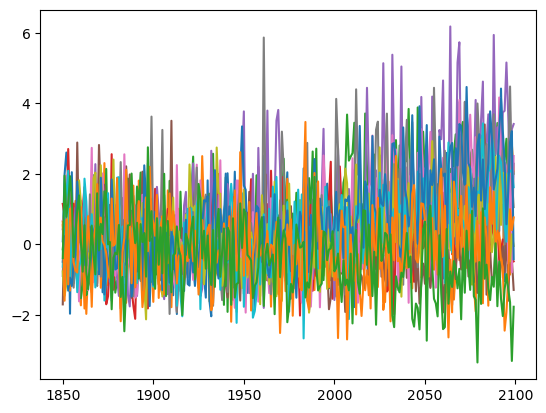

In [8]:
plt.plot(rainfall_yearly)

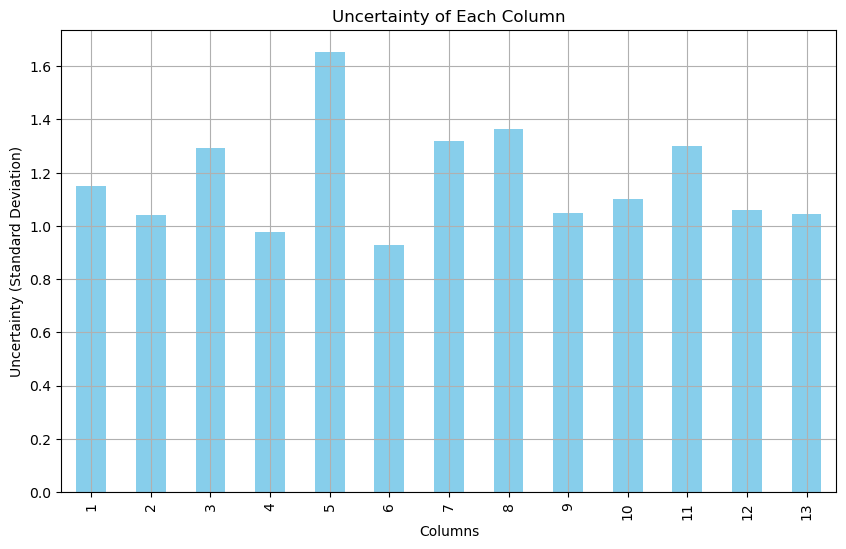

In [9]:
uncertainty = rainfall_yearly.std()

plt.figure(figsize=(10, 6))
uncertainty.plot(kind='bar', color='skyblue')
plt.xlabel('Columns')
plt.ylabel('Uncertainty (Standard Deviation)')
plt.title('Uncertainty of Each Column')
plt.grid(True)
plt.show()


## visualization

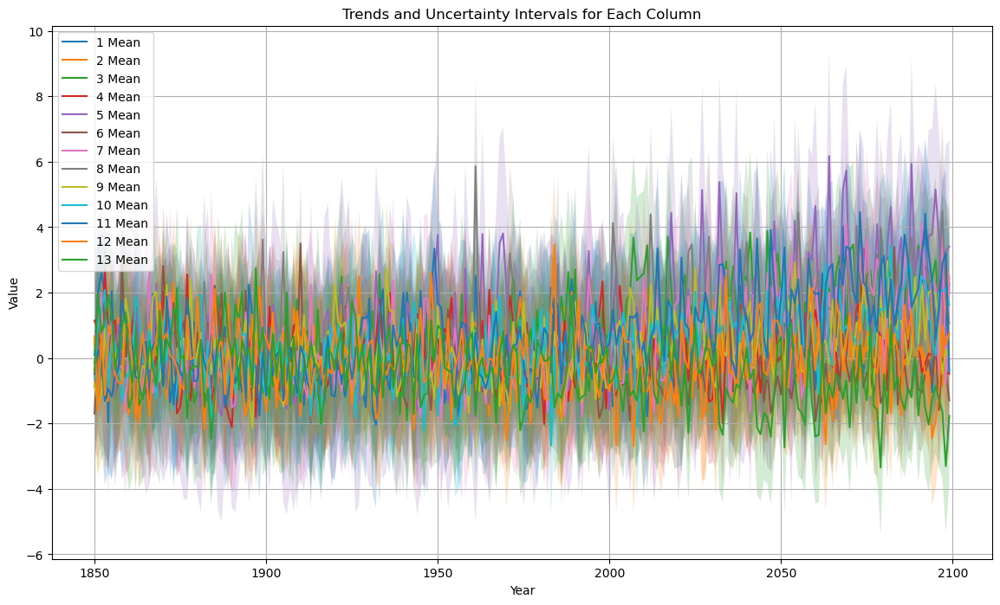

In [10]:
plt.figure(figsize=(14, 8))

for column in rainfall_yearly.columns:
    mean_values = rainfall_yearly[column]
    std_dev = rainfall_yearly[column].std()

    plt.plot(rainfall_yearly.index, mean_values, label=f'{column} Mean')
    plt.fill_between(rainfall_yearly.index, 
                     mean_values - 1.96 * std_dev, 
                     mean_values + 1.96 * std_dev, 
                     alpha=0.2)

plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Trends and Uncertainty Intervals for Each Column')
plt.legend(loc='best')
plt.grid(True)
plt.show()


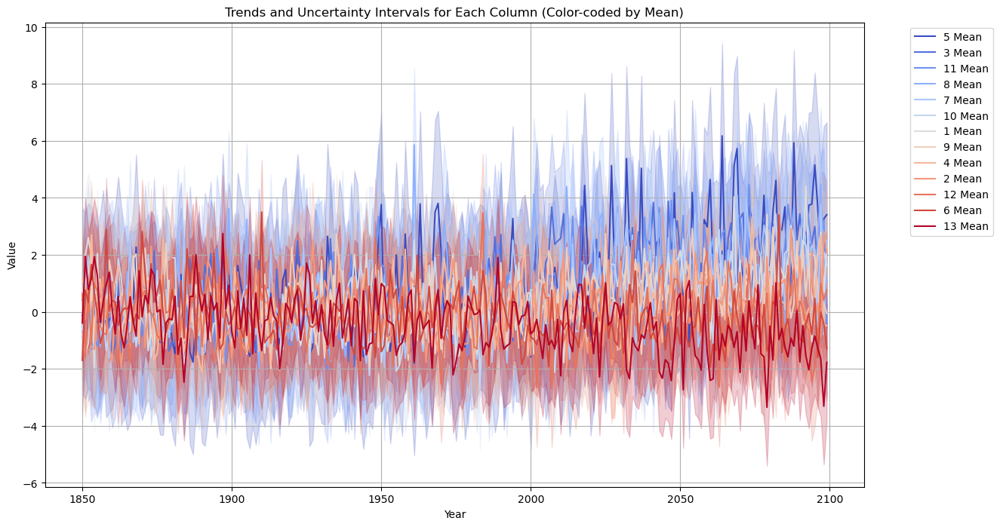

In [11]:
means = rainfall_yearly.mean(axis=0)
sorted_columns = means.sort_values(ascending=False).index
colors = cm.coolwarm(np.linspace(0, 1, len(sorted_columns)))
plt.figure(figsize=(14, 8))

for i, column in enumerate(sorted_columns):
    mean_values = rainfall_yearly[column]
    std_dev = rainfall_yearly[column].std()

    plt.plot(rainfall_yearly.index, mean_values, label=f'{column} Mean', color=colors[i])
    plt.fill_between(rainfall_yearly.index, 
                     mean_values - 1.96 * std_dev, 
                     mean_values + 1.96 * std_dev, 
                     color=colors[i], 
                     alpha=0.2)

plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Trends and Uncertainty Intervals for Each Column (Color-coded by Mean)')
plt.legend(loc='best', bbox_to_anchor=(1.05, 1))
plt.grid(True)
plt.show()


Plotting: 100%|██████████| 251/251 [01:25<00:00,  2.93it/s]


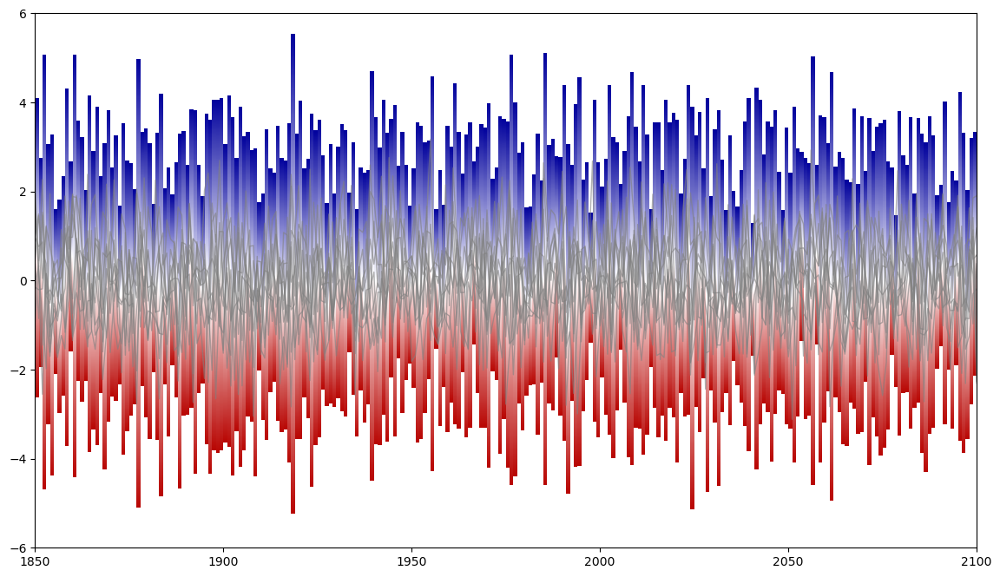

In [ ]:
import matplotlib.colors as mcolors
mean_values = rainfall_yearly.mean(axis=1)
std_dev = rainfall_yearly.std(axis=1)

red_cmap = mcolors.LinearSegmentedColormap.from_list('red_grad', [(184/255, 5/255, 2/255, 0.5), (1, 1, 1, 0.5)])
blue_cmap = mcolors.LinearSegmentedColormap.from_list('blue_grad', [(0/255, 0/255, 156/255, 0.5), (1, 1, 1, 0.5)])
fig, ax = plt.subplots(figsize=(14, 8))

for column in rainfall_yearly.columns:
    ax.plot(rainfall_yearly.index, rainfall_yearly[column], color='gray', alpha=0.6, linewidth=1)
for i in tqdm(range(len(mean_values)), desc="Plotting"):
    lower_bound = mean_values.iloc[i] - 3.3 * std_dev.iloc[i]
    upper_bound = mean_values.iloc[i] + 3.3 * std_dev.iloc[i]
    
    y_vals = np.linspace(lower_bound, upper_bound, 500)
    for j in range(250, 500):
        ax.fill_betweenx([y_vals[j-1], y_vals[j]], 
                         rainfall_yearly.index[i], 
                         rainfall_yearly.index[i] + 1, 
                         color=blue_cmap((500-j)/250), 
                         edgecolor='none')

    for j in range(250):
        ax.fill_betweenx([y_vals[j], y_vals[j+1]], 
                         rainfall_yearly.index[i], 
                         rainfall_yearly.index[i] + 1, 
                         color=red_cmap(j/250), 
                         edgecolor='none')

plt.xlim(1850,2100)
plt.ylim(-6, 6)
plt.show()
fig.savefig("gradient_plot.svg", format="svg", bbox_inches='tight')
plt.close(fig)


In [19]:
mod_ids = range(0, rainfall_yearly.shape[1])
mod_ids_train = range(0, rainfall_yearly.shape[1]-1)
Nobs = 166 # 1850-2015
year = np.array(rainfall_yearly.index)

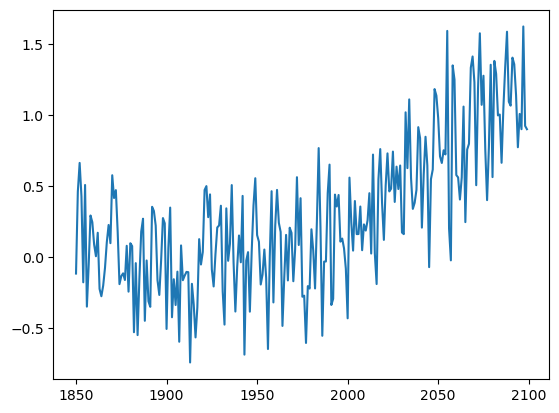

In [ ]:
plt.plot(rainfall_yearly.T.mean())

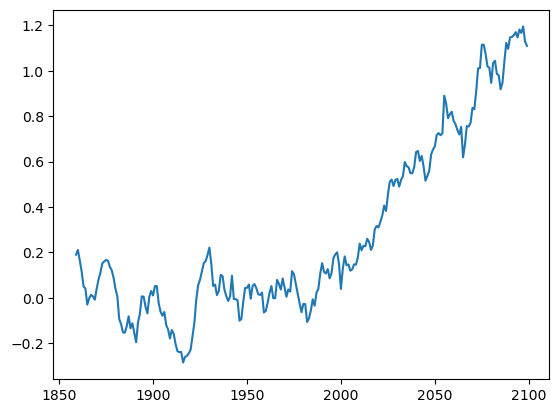

In [ ]:
roll = rainfall_yearly.T.mean().rolling(window=10).mean()
plt.plot(roll)

# kernel function visualization

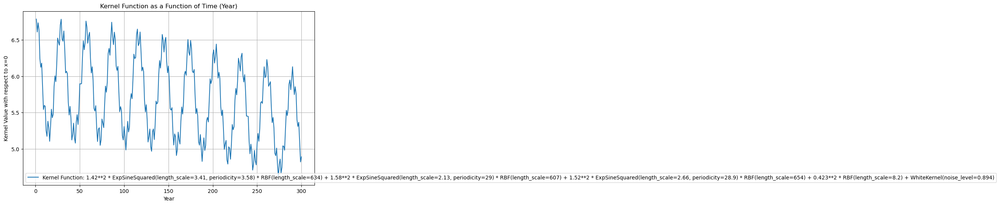

In [ ]:
from sklearn.gaussian_process.kernels import ExpSineSquared, RBF, WhiteKernel, ConstantKernel as C

def plot_kernel_as_function(kernel, x_range=(1, 300), n_points=300):
    x = np.linspace(x_range[0], x_range[1], n_points).reshape(-1, 1)
    x0 = np.array([[0]]) 

    y = kernel(x, x0)[:, 0]

    plt.figure(figsize=(10, 6))
    plt.plot(x, y, label=f"Kernel Function: {kernel}")
    plt.title("Kernel Function as a Function of Time (Year)")
    plt.xlabel("Year")
    plt.ylabel("Kernel Value with respect to x=0")
    plt.legend()
    plt.grid(True)
    plt.show()

# sample
kernel = (1**2 * ExpSineSquared(length_scale=5, periodicity=28.7) * RBF(length_scale=300) +
          1**2 * ExpSineSquared(length_scale=2.93, periodicity=30) * RBF(length_scale=300) +
          0.7**2 * ExpSineSquared(length_scale=2.93, periodicity=5) * RBF(length_scale=300) +
          0.1**2 * RBF(length_scale=10) +
          WhiteKernel(noise_level=1e-3))
kernel=0.7**2 * ExpSineSquared(length_scale=3, periodicity=6.74) * RBF(length_scale=257) + 1**2 * ExpSineSquared(length_scale=3, periodicity=29.7) * RBF(length_scale=277) + 1.02**2 * ExpSineSquared(length_scale=3, periodicity=28.3) * RBF(length_scale=231) + 0.393**2 * RBF(length_scale=1) + WhiteKernel(noise_level=0.1)
kernel=0.5**2 * ExpSineSquared(length_scale=3, periodicity=6.74) * RBF(length_scale=500) + 0.5**2 * ExpSineSquared(length_scale=3, periodicity=29.7) * RBF(length_scale=500)+ 0.5**2 * ExpSineSquared(length_scale=3, periodicity=28.3)* RBF(length_scale=500) + 0.01**2  * RBF(length_scale=231) + WhiteKernel(noise_level=0.01)
kernel=1.51**2 * ExpSineSquared(length_scale=3.3, periodicity=4.73) * RBF(length_scale=638) + 1.45**2 * ExpSineSquared(length_scale=2.46, periodicity=27.7) * RBF(length_scale=610) + 1.53**2 * ExpSineSquared(length_scale=2.79, periodicity=29.1) * RBF(length_scale=607) + 0.511**2 * RBF(length_scale=6.63) + WhiteKernel(noise_level=0.826)

kernel=1.42**2 * ExpSineSquared(length_scale=3.41, periodicity=3.58) * RBF(length_scale=634) + 1.58**2 * ExpSineSquared(length_scale=2.13, periodicity=29) * RBF(length_scale=607) + 1.52**2 * ExpSineSquared(length_scale=2.66, periodicity=28.9) * RBF(length_scale=654) + 0.423**2 * RBF(length_scale=8.2) + WhiteKernel(noise_level=0.894)

plot_kernel_as_function(kernel, x_range=(1, 300), n_points=300)


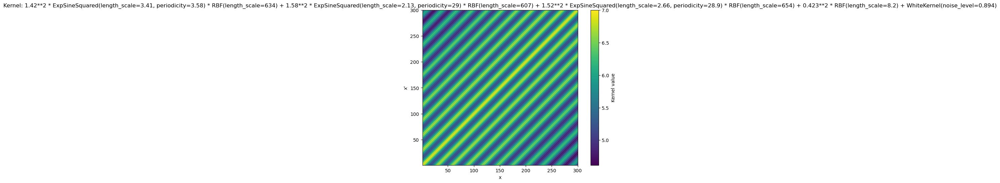

In [ ]:
def plot_kernel(kernel, x_range=(1, 300), n_points=1000):
    x = np.linspace(x_range[0], x_range[1], n_points)
    x = x[:, np.newaxis]
    K = kernel(x, x)

    plt.figure(figsize=(10, 6))
    plt.imshow(K, extent=(x_range[0], x_range[1], x_range[0], x_range[1]), origin='lower')
    plt.title(f"Kernel: {kernel}")
    plt.colorbar(label="Kernel value")
    plt.xlabel("x")
    plt.ylabel("x'")
    plt.show()

kernel=1.42**2 * ExpSineSquared(length_scale=3.41, periodicity=3.58) * RBF(length_scale=634) + 1.58**2 * ExpSineSquared(length_scale=2.13, periodicity=29) * RBF(length_scale=607) + 1.52**2 * ExpSineSquared(length_scale=2.66, periodicity=28.9) * RBF(length_scale=654) + 0.423**2 * RBF(length_scale=8.2) + WhiteKernel(noise_level=0.894)
plot_kernel(kernel, x_range=(1, 300), n_points=1000)


# periodic analysis

In [ ]:
# Function to plot and return the top 3 periodicities for each method
def analyze_periodicity(data):
    results = {}
    
    # Convert data to numpy array for FFT
    data = np.asarray(data)
    
    # Fourier Transform
    N = len(data)
    T = 1.0
    yf = fft(data)
    xf = np.fft.fftfreq(N, T)[:N//2]
    fft_amplitudes = 2.0/N * np.abs(yf[0:N//2])
    
    # Avoid division by zero
    non_zero_freqs = xf != 0
    xf = xf[non_zero_freqs]
    fft_amplitudes = fft_amplitudes[non_zero_freqs]
    
    fft_peaks = np.argsort(fft_amplitudes)[-3:]
    fft_periods = 1 / xf[fft_peaks]
    results['FFT'] = fft_periods
    
    # Wavelet Transform
    widths = np.arange(1, 31)
    cwt_matr = pywt.cwt(data, widths, 'mexh')[0]
    wavelet_power = np.sum(cwt_matr**2, axis=1)
    wavelet_peaks = np.argsort(wavelet_power)[-3:]
    wavelet_periods = widths[wavelet_peaks]
    results['Wavelet'] = wavelet_periods
    
    # Autocorrelation
    autocorr = acf(data, nlags=N//2)
    autocorr_peaks = np.argsort(autocorr)[-3:]
    results['Autocorrelation'] = autocorr_peaks
    
    # Power Spectral Density
    freqs, psd = periodogram(data)
    non_zero_freqs = freqs != 0
    freqs = freqs[non_zero_freqs]
    psd = psd[non_zero_freqs]
    
    psd_peaks = np.argsort(psd)[-3:]
    psd_periods = 1 / freqs[psd_peaks]
    results['PSD'] = psd_periods
    
    return results

# Perform the analysis for each of the 16 models
all_results = []
for col in rainfall_yearly_test.columns:
    data = rainfall_yearly_test[col]
    results = analyze_periodicity(data)
    all_results.append(results)

# Aggregate and print the results
for method in ['FFT', 'Wavelet', 'Autocorrelation', 'PSD']:
    print(f"Top 3 periodicities for {method}:")
    for i, result in enumerate(all_results):
        print(f"Model {i+1}: {result[method]}")
    print("\n")

Top 3 periodicities for FFT:
Model 1: [2.19298246 3.90625    3.62318841]
Model 2: [  3.04878049 250.         125.        ]
Model 3: [  3.04878049 250.         125.        ]
Model 4: [  6.57894737 125.         250.        ]
Model 5: [2.3364486  2.68817204 2.60416667]


Top 3 periodicities for Wavelet:
Model 1: [2 3 1]
Model 2: [28 29 30]
Model 3: [28 29 30]
Model 4: [28 29 30]
Model 5: [4 6 5]


Top 3 periodicities for Autocorrelation:
Model 1: [55 65  0]
Model 2: [6 3 0]
Model 3: [ 3 18  0]
Model 4: [6 1 0]
Model 5: [70 56  0]


Top 3 periodicities for PSD:
Model 1: [2.19298246 3.90625    3.62318841]
Model 2: [  3.04878049 250.         125.        ]
Model 3: [  3.04878049 250.         125.        ]
Model 4: [  6.57894737 125.         250.        ]
Model 5: [2.3364486  2.68817204 2.60416667]




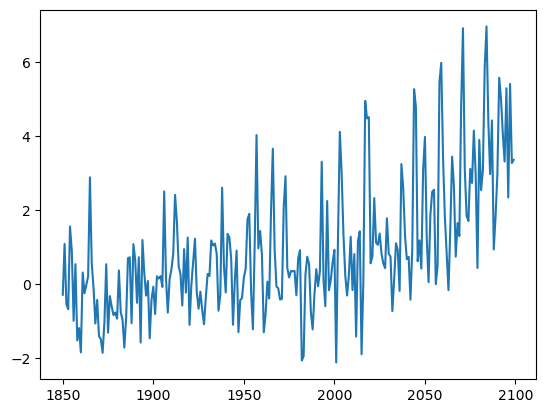

In [ ]:
plt.plot(rainfall_yearly_test.iloc[:,3])

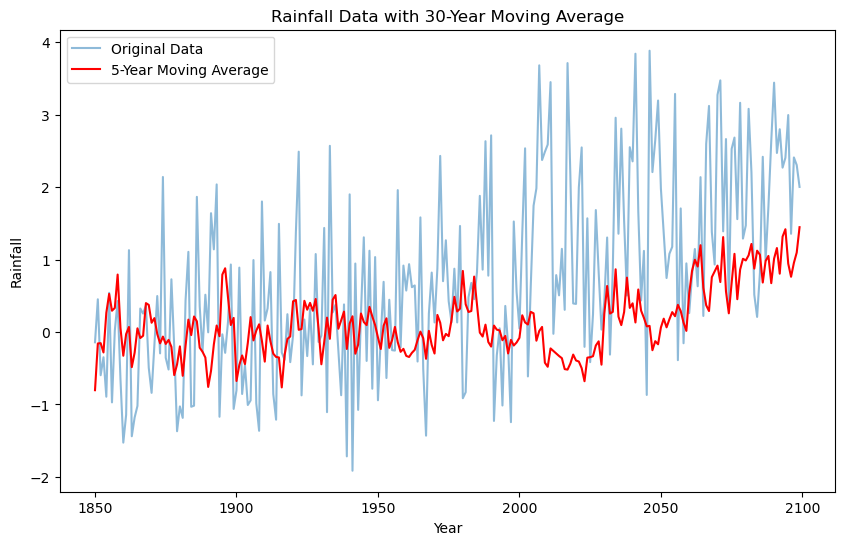

In [ ]:
rainfall_smoothed_training = rainfall_yearly_test.iloc[:, 1].rolling(window=5, min_periods=1).mean()

plt.figure(figsize=(10, 6))
plt.plot(rainfall_yearly.iloc[:, 2], label='Original Data', alpha=0.5)
plt.plot(rainfall_smoothed_training, label='5-Year Moving Average', color='red')
plt.xlabel('Year')
plt.ylabel('Rainfall')
plt.title('Rainfall Data with 30-Year Moving Average')
plt.legend()
plt.show()

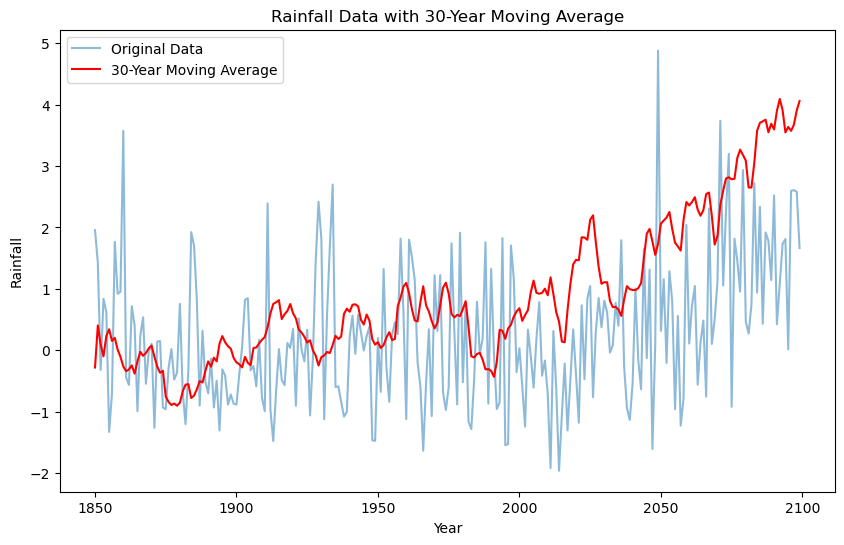

In [ ]:
rainfall_smoothed = rainfall_yearly_test.iloc[:, 3].rolling(window=10, min_periods=1).mean()

plt.figure(figsize=(10, 6))
plt.plot(rainfall_yearly_test.iloc[:, 2], label='Original Data', alpha=0.5)
plt.plot(rainfall_smoothed, label='30-Year Moving Average', color='red')
plt.xlabel('Year')
plt.ylabel('Rainfall')
plt.title('Rainfall Data with 10-Year Moving Average')
plt.legend()
plt.show()

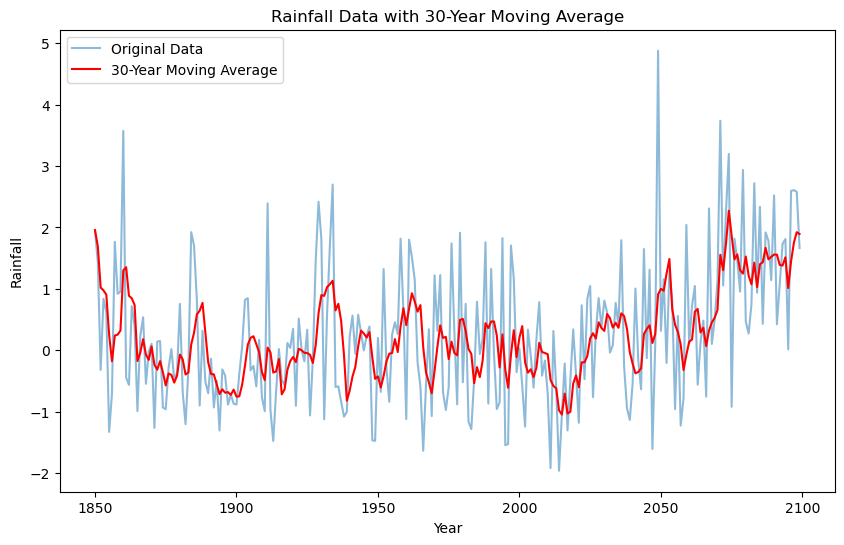

In [ ]:
rainfall_smoothed = rainfall_yearly_test.iloc[:, 2].rolling(window=5, min_periods=1).mean()

plt.figure(figsize=(10, 6))
plt.plot(rainfall_yearly_test.iloc[:, 2], label='Original Data', alpha=0.5)
plt.plot(rainfall_smoothed, label='30-Year Moving Average', color='red')
plt.xlabel('Year')
plt.ylabel('Rainfall')
plt.title('Rainfall Data with 5-Year Moving Average')
plt.legend()
plt.show()


# Function

In [9]:
# Gaussian Filter for Smoothing
from scipy.ndimage import gaussian_filter1d

def periodic_smoothing(data, period, sigma):
    num_periods = len(data) // period
    smoothed_data = np.zeros_like(data)
    
    for i in range(num_periods):
        segment = data[i * period:(i + 1) * period]
        smoothed_segment = gaussian_filter1d(segment, sigma=sigma)
        smoothed_data[i * period:(i + 1) * period] = smoothed_segment
    if len(data) % period != 0:
        remaining_segment = data[num_periods * period:]
        smoothed_remaining = gaussian_filter1d(remaining_segment, sigma=sigma)
        smoothed_data[num_periods * period:] = smoothed_remaining
    
    return smoothed_data

In [11]:
def log_marginal_likelihood_manual(kernel, y_train):
    L = np.linalg.cholesky(kernel)
    alpha = cho_solve((L, True), y_train)
    log_likelihood = -0.5 * np.dot(y_train.T, alpha)
    log_likelihood -= np.sum(np.log(np.diag(L)))
    log_likelihood -= len(y_train) / 2 * np.log(2 * np.pi)
    return log_likelihood

def Choleskey_trick(A, diff, K_os):
    L = np.linalg.cholesky(A)
    alpha = np.linalg.solve(L.T, np.linalg.solve(L, diff))
    v = np.linalg.solve(L, K_os)
    return alpha, v, L

def compute_prior_and_posterior(K_full, y_train, y_test, Nobs):
    N_all = Nobs * 2 
    K_o = K_full[:Nobs, :Nobs] 
    K_s = K_full[Nobs:, Nobs:] 
    K_os = K_full[:Nobs, Nobs:]

    tmp = np.vstack((y_train.iloc[:Nobs, :], y_train))
    smoothedMean = np.mean(tmp, axis=1)
    smoothedMean = periodic_smoothing(smoothedMean, 30, 2)
    mu = smoothedMean[:Nobs]  
    mu_s = smoothedMean[Nobs:] 

    y = y_test[:Nobs].values
    diff = y - mu
    if diff.ndim == 1:
        diff = diff[:, np.newaxis]

    A = K_o
    eigenvalues = np.linalg.eigvalsh(A)
    assert np.all(eigenvalues >= 0)
    
    alpha, v, L = Choleskey_trick(A, diff, K_os)
    f = mu_s + np.dot(K_os.T, alpha).ravel()  

    Sigma_s = K_s - np.dot(v.T, v)
    
    y_test_part = y_test[Nobs:].values 
    mu_test_part = mu_s[-len(y_test_part):]
    diff_test = y_test_part - mu_test_part  
    if diff_test.ndim == 1:
        diff_test = diff_test[:, np.newaxis]

    K_test = K_full[N_all:, N_all:]
    A_test = K_test+ 1e-6 * np.eye(K_test.shape[0])
    K_test_os = K_full[N_all:, :Nobs]
    alpha_test, v_test, L_test = Choleskey_trick(A_test, diff_test, K_test_os)
    lml = -0.5 * (np.dot(diff_test.T, alpha_test) + 2 * np.sum(np.log(np.diag(L_test)))).item()

    prior_mu = np.mean(tmp, axis=1)[Nobs:]
    prior_cov = K_s
    post_mu = f
    post_cov = Sigma_s

    return prior_mu, prior_cov, post_mu, post_cov, lml

In [20]:
def kernel_tune(mod_ids, Nobs, data, pbounds, kernel_func, virtualobs):
    np.float = np.float64

    def compute_KGCM(training_data, Nobs):
        tmp = np.vstack((training_data.iloc[:Nobs, :], training_data))
        smoothedCov = np.cov(tmp, rowvar=True)
        N_all = Nobs * 2
        noise_matrix = np.zeros_like(smoothedCov)
        np.fill_diagonal(noise_matrix[:N_all, :N_all], 0.86)
        KGCM = (13 / 12) * smoothedCov + noise_matrix
        return KGCM

    def compute_KGCM_plot(data, Nobs):
        tmp = np.vstack((data.iloc[:Nobs, :], data))
        smoothedCov = np.cov(tmp, rowvar=True)
        N_all = Nobs * 2
        noise_matrix = np.zeros_like(smoothedCov)
        np.fill_diagonal(noise_matrix[:N_all, :N_all], 0.86)
        KGCM = (14 / 13) * smoothedCov + noise_matrix
        return KGCM

    def gp_target(data, current_mod_ids, **params):
        print("Received params:", params)
        total_lml = 0.0
        kernel = kernel_func(params)
        for mod_id in current_mod_ids:
            if mod_id >= data.shape[1]:
                print(f"mod_id {mod_id} is out of bounds for data with {data.shape[1]} columns.")
                continue
            try:
                train_mod_ids = [train_mod_id for idx, train_mod_id in enumerate(current_mod_ids) if idx != mod_id]
                train_data = data.iloc[:, train_mod_ids]
                oos_gcm = data.iloc[:, mod_id].values
            except IndexError as e:
                print(f"IndexError for mod_id {mod_id}: {e}")
                continue

            X_ooc = np.arange(Nobs).reshape(-1, 1)
            y_ooc = oos_gcm[:Nobs]
            

            try:
                K_kernel = kernel(X_ooc, X_ooc)
                KGCM = compute_KGCM(train_data, Nobs)
                KGCM_o = KGCM[:Nobs, :Nobs]
                K_combined = K_kernel + KGCM_o
                lml = log_marginal_likelihood_manual(K_combined, y_ooc)
                
                if np.isreal(lml):
                    total_lml += lml
                else:
                    total_lml -= np.inf
            except (TypeError, np.linalg.LinAlgError) as e:
                print("Error in kernel construction or GP fitting:", e)
                total_lml -= np.inf
        print(f"Total LML for current params: {total_lml}") 
        return total_lml
        
    optimizer = BayesianOptimization(
            f=lambda **params: gp_target(data, list(range(len(mod_ids))), **params), 
            pbounds=pbounds, 
            random_state=90
        )

    total_iterations = 0
    init_points = 1
    best_params = None

    with tqdm(total=total_iterations, desc=f"Optimization Progress") as pbar:
        try:
            optimizer.maximize(init_points=init_points, n_iter=total_iterations)
            pbar.update(total_iterations)
        except Exception as e:
            print("An error occurred during optimization:", e)
            if 'params' in optimizer.max:
                best_params = optimizer.max['params']
                kernel = kernel_func(best_params)
            else:
                best_params = None

    best_params = optimizer.max['params']                
    kernel = kernel_func(best_params)
    if best_params is not None:
        try:
            kernel = kernel_func(best_params)
            print("Best kernel is:", kernel)

            X_full = np.arange(data.shape[0] + Nobs).reshape(-1, 1)
            lml_all = 0
            
            # for i in range(data.shape[1]):
            #     train_mod_ids = [mod_id for idx, mod_id in enumerate(mod_ids) if idx != i]
            #     train_data = data.iloc[:, train_mod_ids]
            #     KGCM = compute_KGCM(train_data, Nobs)
            #     K_full = kernel(X_full, X_full)
            #     K_full +=  KGCM
            #     prior_mu, prior_cov, post_mu, post_cov, lml = compute_prior_and_posterior(K_full, train_data, data.iloc[:, i], Nobs)
            #     lml_all += lml 

            # print(f"Total test lml: {lml_all}")
            
            K_full = kernel(X_full, X_full)
            KGCM = compute_KGCM_plot(data, Nobs)
            K_full +=  KGCM
            prior_mu, prior_cov, post_mu, post_cov, lml = compute_prior_and_posterior(K_full, data, virtualobs, Nobs)
            plot_prior_posterior(year, virtualobs, prior_mu, prior_cov, post_mu, post_cov)
        except Exception as e:
            print(f"An error occurred: {e}")
            
    return year, virtualobs, prior_mu, prior_cov, post_mu, post_cov

### differnent plot functions

In [14]:
def plot_prior_posterior(X, obs, prior_mu, prior_cov, post_mu, post_cov):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 1)
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    plt.figure(figsize=(10, 6))    
    # plt.plot(X, prior_mu, color='grey', label='Prior Mean', alpha=0.5, lw=2)
    plt.fill_between(X.flatten(), prior_mu - 1.5*std_prior, prior_mu + 1.5*std_prior, alpha=0.2, color='grey', label='Prior 95% CI')
    
    plt.fill_between(X.flatten(), post_mu - 1.64*std_post, post_mu + 1.64*std_post, alpha=0.2, color=rgb_to_normalized((164, 81, 79)), label='Posterior 95% CI')
    # plt.plot(X, obs, color=rgb_to_normalized((8,124,148)), lw=2, label='Virtual Observation', alpha=0.4)
    plt.plot(X, obs, color='r', lw=2, label='Virtual Observation', alpha=0.4)
    plt.plot(X, post_mu, color=rgb_to_normalized((164, 81, 79)), lw=3,label='Posterior Mean')
    # plt.plot(X, post_mu, color=rgb_to_normalized((234,171,0)), lw=3,label='Posterior Mean')
    plt.axvline(x=year[Nobs], color='black', linestyle='--', label='Historical/Future Split')
    plt.title((f'GPR Prediction with {Nobs} years as real observation'))
    plt.xlabel('Year')
    plt.ylabel('Precipitation')
    plt.ylim(-6,8)
    plt.show()

In [15]:
def plot_prior_posterior_blue(X, obs, prior_mu, prior_cov, post_mu, post_cov):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 1)
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    plt.figure(figsize=(10, 6))    
    # plt.plot(X, prior_mu, color='grey', label='Prior Mean', alpha=0.5, lw=2)
    plt.fill_between(X.flatten(), prior_mu - 1.5*std_prior, prior_mu + 1.5*std_prior, alpha=0.2, color='grey', label='Prior 95% CI')
    
    plt.fill_between(X.flatten(), post_mu - 1.64*std_post, post_mu + 1.64*std_post, alpha=0.2, color=rgb_to_normalized((47, 82, 143)), label='Posterior 95% CI')
    # plt.plot(X, obs, color=rgb_to_normalized((8,124,148)), lw=2, label='Virtual Observation', alpha=0.4)
    plt.plot(X, obs, color='blue', lw=2, label='Virtual Observation', alpha=0.4)
    plt.plot(X, post_mu, color=rgb_to_normalized((47, 82, 143)), lw=3,label='Posterior Mean')
    # plt.plot(X, post_mu, color=rgb_to_normalized((234,171,0)), lw=3,label='Posterior Mean')
    plt.axvline(x=year[Nobs], color='black', linestyle='--', label='Historical/Future Split')
    plt.title((f'GPR Prediction with {Nobs} years as real observation'))
    plt.xlabel('Year')
    plt.ylabel('Precipitation')
    plt.ylim(-6,8)
    plt.show()

In [23]:
def plot_prior_posterior_test(X, obs, prior_mu, prior_cov, post_mu, post_cov, save_path):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 1)
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    plt.figure(figsize=(10, 6))    
    plt.plot(X, prior_mu, color='grey', label='Prior Mean', alpha=0.3, lw=2)
    plt.fill_between(X.flatten(), prior_mu - 1.5*std_prior, prior_mu + 1.5*std_prior, alpha=0.15, color='grey', label='Prior 95% CI')
    
    plt.fill_between(X.flatten(), post_mu - 1.64*std_post, post_mu + 1.64*std_post, alpha=0.2, color=rgb_to_normalized((234,171,0)), label='Posterior 95% CI')
    plt.plot(X, obs, color=rgb_to_normalized((8,124,148)), lw=2, label='Virtual Observation', alpha=0.5)
    plt.plot(X, post_mu, color=rgb_to_normalized((234,171,0)), lw=3, label='Posterior Mean')
    plt.axvline(x=year[Nobs], color='black', linestyle='--', label='Observation/Prediction Split')
    plt.title((f'GPR Prediction with {Nobs} years as real observation'))
    plt.xlabel('Year')
    plt.ylabel('Precipitation')
    plt.ylim(-6,8)
    
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=6)
    plt.savefig(save_path, format='svg', bbox_inches='tight')
    
    plt.show()


In [157]:
def save_prior_posterior(X, obs, prior_mu, prior_cov, post_mu, post_cov, save_path):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 1)
    post_mu += 0.1
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    plt.figure(figsize=(10, 6))    
    plt.plot(X, prior_mu, color='grey', label='Prior Mean', alpha=0.5, lw=2)
    plt.fill_between(X.flatten(), prior_mu - 1.5*std_prior, prior_mu + 1.5*std_prior, alpha=0.2, color='grey', label='Prior 95% CI')
    
    plt.fill_between(X.flatten(), post_mu - 1.64*std_post, post_mu + 1.64*std_post, alpha=0.2, color=rgb_to_normalized((234,171,0)), label='Posterior 95% CI')
    plt.plot(X, obs, color=rgb_to_normalized((8,124,148)), lw=2, label='Virtual Observation', alpha=0.4)
    # plt.plot(X, post_mu, color=rgb_to_normalized((164, 81, 79)), lw=3,label='Posterior Mean')
    plt.plot(X, post_mu, color=rgb_to_normalized((234,171,0)), lw=3,label='Posterior Mean')
    plt.axvline(x=year[Nobs], color='black', linestyle='--', label='Historical/Future Split')
    # plt.title((f'GPR Prediction with {Nobs} years as real observation'))
    plt.xlabel('Year')
    plt.ylabel('Precipitation')
    plt.xlim(1850,2100)
    plt.ylim(-6,8)
    plt.savefig(save_path, format='svg', bbox_inches='tight')  # Save as SVG, or change format to 'pdf' for PDF
    plt.show()

# Kernel

Test different kernels. Note that '_' means the sum of kernel, and kernel1kernel2 means kernel1*kernel2. Number means how many kernels we use of the same structure.

With other kernels to be implementation. Such as some kernels to make an addition or product.

## rbf*pe

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -1087.2904737674828
| 1         | -1.087e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.33

Optimization Progress: 100%|██████████| 20/20 [00:05<00:00,  3.83it/s]

Received params: {'c2': 2.0281882739897155, 'c3': 2.306445494425399, 'c4': 2.045518111664002, 'c_rbf': 0.49042261879443233, 'ls1': 3.469771712601576, 'ls2': 2.6133228915225675, 'ls3': 2.8579087337005347, 'noise': 0.3084249451715687, 'per1': 5.876812134955873, 'per2': 29.74288571426794, 'per3': 28.001778069014268, 'rbf_ls1': 601.0474929439464, 'rbf_ls2': 648.3232726683688, 'rbf_ls3': 667.1298249368477, 'rbf_ls4': 8.699806322356006}
Total LML for current params: -1069.158206842491
| 59        | -1.069e+0 | 2.028     | 2.306     | 2.046     | 0.4904    | 3.47      | 2.613     | 2.858     | 0.3084    | 5.877     | 29.74     | 28.0      | 601.0     | 648.3     | 667.1     | 8.7       |
Received params: {'c2': 2.5, 'c3': 2.147882992839699, 'c4': 2.5, 'c_rbf': 0.16752274153204283, 'ls1': 3.322680342157415, 'ls2': 2.446102359200451, 'ls3': 2.4753051774844983, 'noise': 0.048666516430848336, 'per1': 5.818077308236229, 'per2': 27.325928766467886, 'per3': 27.319485695738003, 'rbf_ls1': 661.1751320

Optimization Progress: 100%|██████████| 20/20 [00:05<00:00,  3.83it/s]


Best kernel is: 1.5**2 * ExpSineSquared(length_scale=3.42, periodicity=5.42) * RBF(length_scale=680) + 1.41**2 * ExpSineSquared(length_scale=2.76, periodicity=27.4) * RBF(length_scale=691) + 1.41**2 * ExpSineSquared(length_scale=2.25, periodicity=30.4) * RBF(length_scale=688) + 0.377**2 * RBF(length_scale=10) + WhiteKernel(noise_level=0.523)


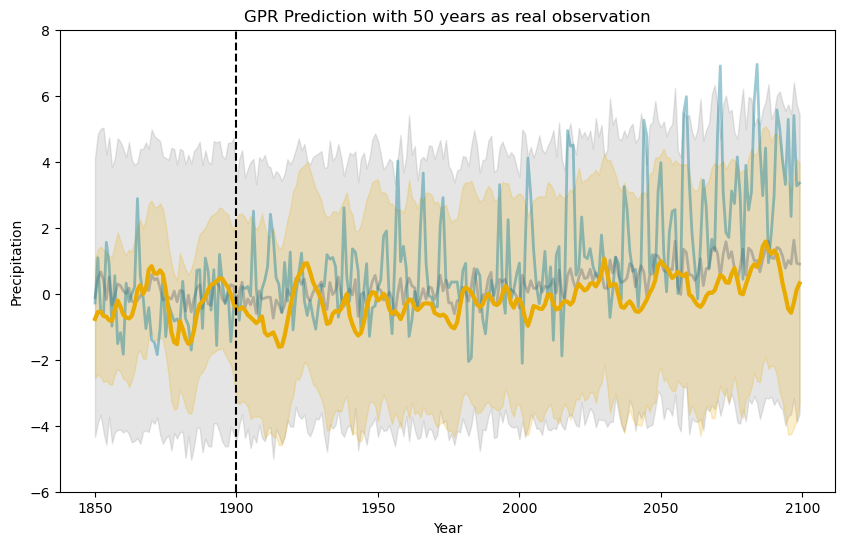

In [51]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) + 
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),  
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),   
    'rbf_ls2': (600, 700),     
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10), 
    'noise': (1e-6, 1),
}

Nobs=50
year1, virtualobs1, prior_mu1, prior_cov1, post_mu1, post_cov1 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 3])

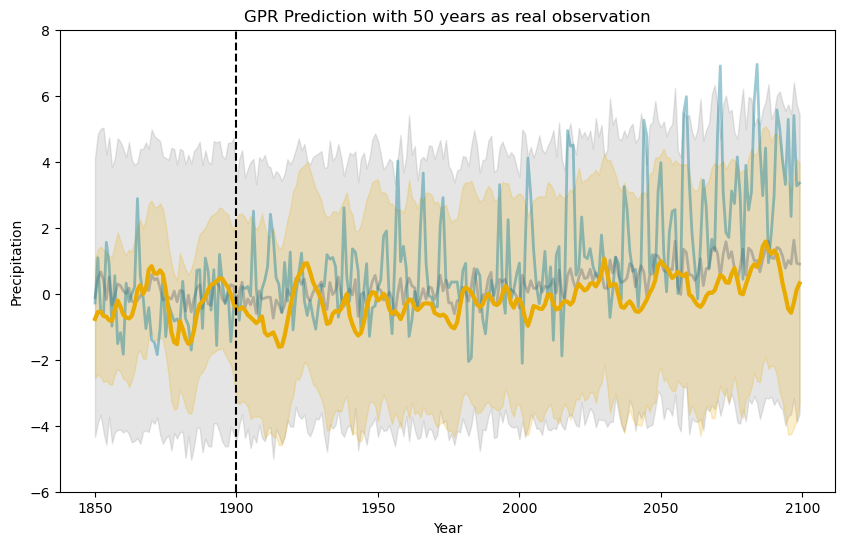

In [59]:
save_prior_posterior(year1, virtualobs1, prior_mu1, prior_cov1, post_mu1, post_cov1, '../poster/plot/result/pe_50.svg')

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -2095.094406928716
| 1         | -2.095e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.334

Optimization Progress: 100%|██████████| 30/30 [00:20<00:00,  1.43it/s]

Received params: {'c2': 2.0, 'c3': 2.0, 'c4': 2.0, 'c_rbf': 1.0, 'ls1': 3.0, 'ls2': 3.0, 'ls3': 3.0, 'noise': 1e-06, 'per1': 3.0, 'per2': 30.638680325085378, 'per3': 27.782562247383826, 'rbf_ls1': 620.4745050864924, 'rbf_ls2': 670.5260071375544, 'rbf_ls3': 695.2143860474205, 'rbf_ls4': 5.0}
Total LML for current params: -2087.8784841297725
| 80        | -2.088e+0 | 2.0       | 2.0       | 2.0       | 1.0       | 3.0       | 3.0       | 3.0       | 1e-06     | 3.0       | 30.64     | 27.78     | 620.5     | 670.5     | 695.2     | 5.0       |
Best kernel is: 1.41**2 * ExpSineSquared(length_scale=3, periodicity=3) * RBF(length_scale=623) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=27) * RBF(length_scale=688) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=27) * RBF(length_scale=691) + 0.316**2 * RBF(length_scale=8.96) + WhiteKernel(noise_level=1e-06)


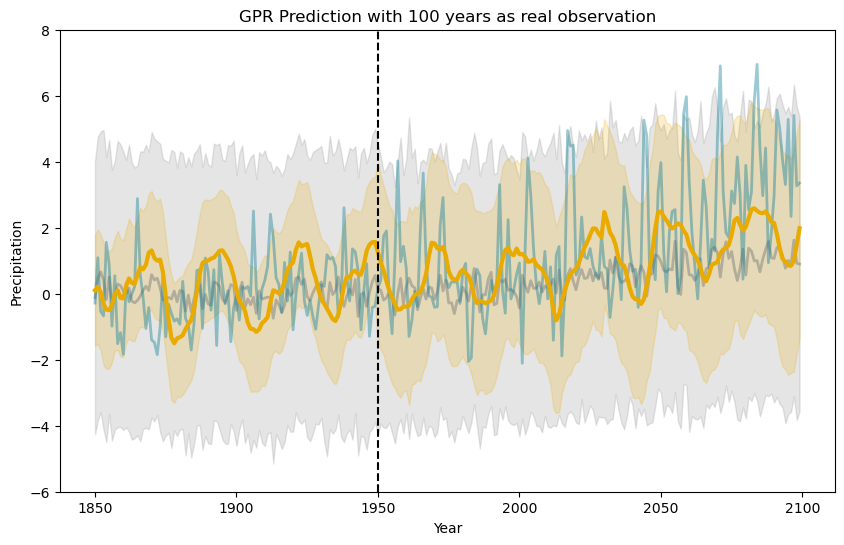

In [62]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) +  
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),   
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),    
    'rbf_ls2': (600, 700),    
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10), 
    'noise': (1e-6, 1),
}

Nobs=100
year2, virtualobs2, prior_mu2, prior_cov2, post_mu2, post_cov2 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 3])

In [67]:
post_mu2 = periodic_smoothing(post_mu2, 30, 0.01)

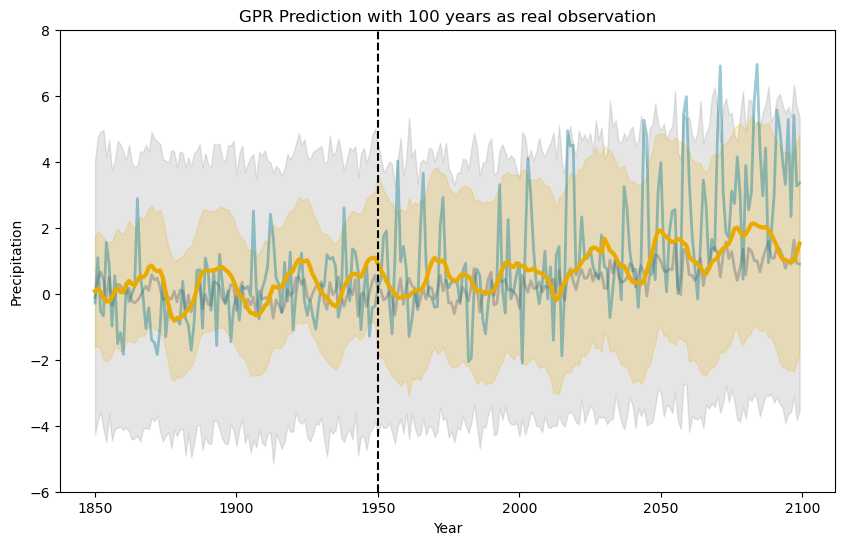

In [68]:
save_prior_posterior(year2, virtualobs2, prior_mu2, prior_cov2, post_mu2, post_cov2, '../poster/plot/result/pe_100.svg')

Optimization Progress: 0it [00:00, ?it/s]


|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -3138.987919059395
| 1         | -3.139e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.334

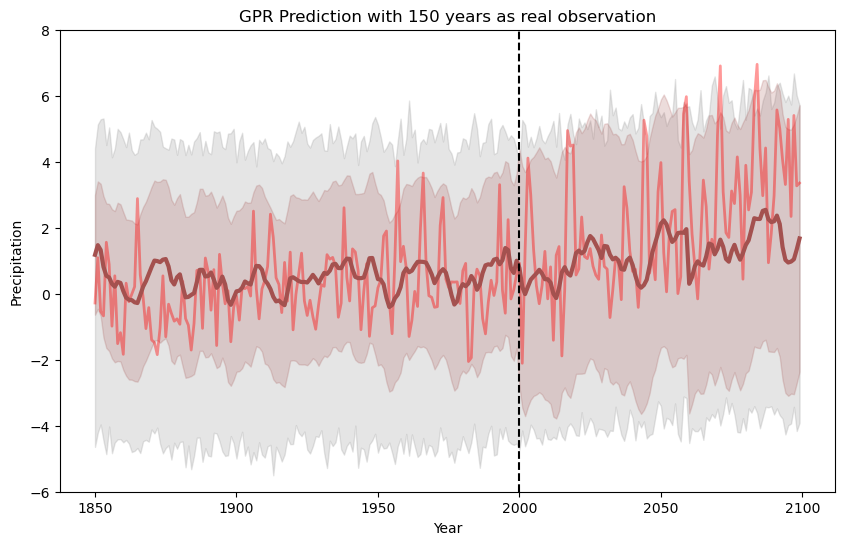

In [21]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) + 
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),  
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),     
    'rbf_ls2': (600, 700),    
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10), 
    'noise': (1e-6, 1),
}

Nobs=150
year3, virtualobs3, prior_mu3, prior_cov3, post_mu3, post_cov3 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 3])

In [81]:
post_mu3 = periodic_smoothing(post_mu3, 30, 0.01)

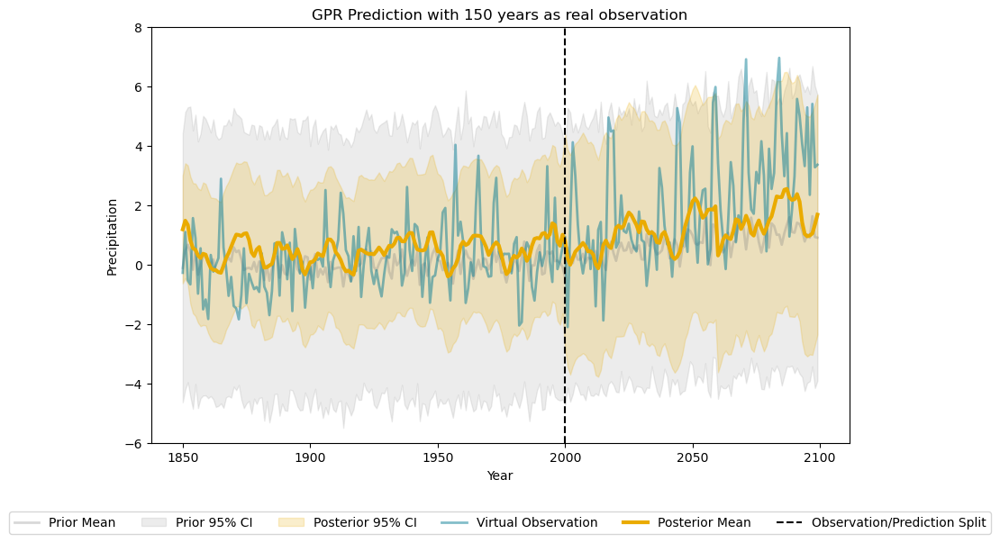

In [24]:
plot_prior_posterior_test(year3, virtualobs3, prior_mu3, prior_cov3, post_mu3, post_cov3, '../poster/plot/result/label_new.svg')

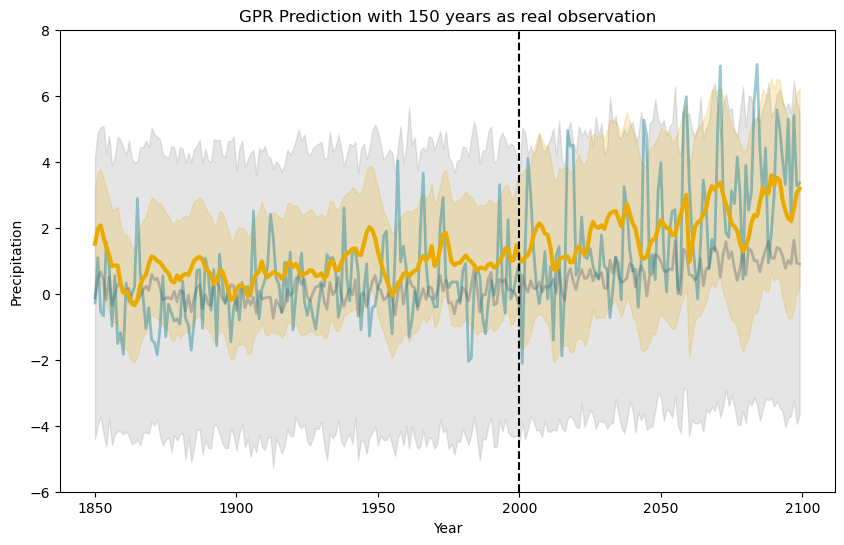

In [82]:
Nobs=150
save_prior_posterior(year3, virtualobs3, prior_mu3, prior_cov3, post_mu3, post_cov3, '../poster/plot/result/pe_150.svg')

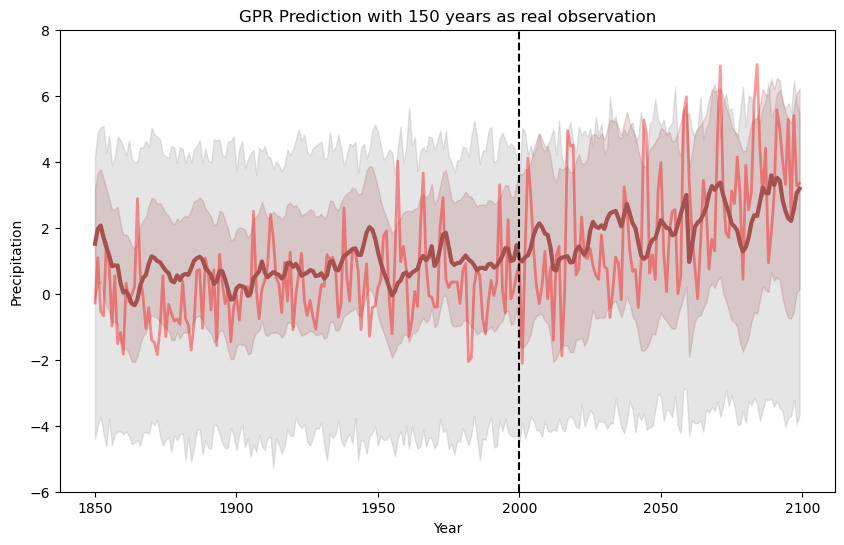

In [185]:
Nobs=150
plot_prior_posterior(year3, virtualobs3, prior_mu3, prior_cov3, post_mu3, post_cov3)

Optimization Progress:   0%|          | 0/40 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -3138.987919059395
| 1         | -3.139e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.334

Optimization Progress: 100%|██████████| 40/40 [00:34<00:00,  1.17it/s]

Received params: {'c2': 2.5, 'c3': 2.5, 'c4': 2.5, 'c_rbf': 0.1, 'ls1': 3.0, 'ls2': 2.070402158328317, 'ls3': 3.0, 'noise': 1e-06, 'per1': 3.0, 'per2': 29.199011677989766, 'per3': 27.0, 'rbf_ls1': 620.3308451195753, 'rbf_ls2': 612.9067324998312, 'rbf_ls3': 637.1813679420545, 'rbf_ls4': 10.0}
Total LML for current params: -3064.0415243879165
| 160       | -3.064e+0 | 2.5       | 2.5       | 2.5       | 0.1       | 3.0       | 2.07      | 3.0       | 1e-06     | 3.0       | 29.2      | 27.0      | 620.3     | 612.9     | 637.2     | 10.0      |
Best kernel is: 1.58**2 * ExpSineSquared(length_scale=3, periodicity=3) * RBF(length_scale=621) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=29.2) * RBF(length_scale=613) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=28.6) * RBF(length_scale=638) + 0.316**2 * RBF(length_scale=10) + WhiteKernel(noise_level=1)


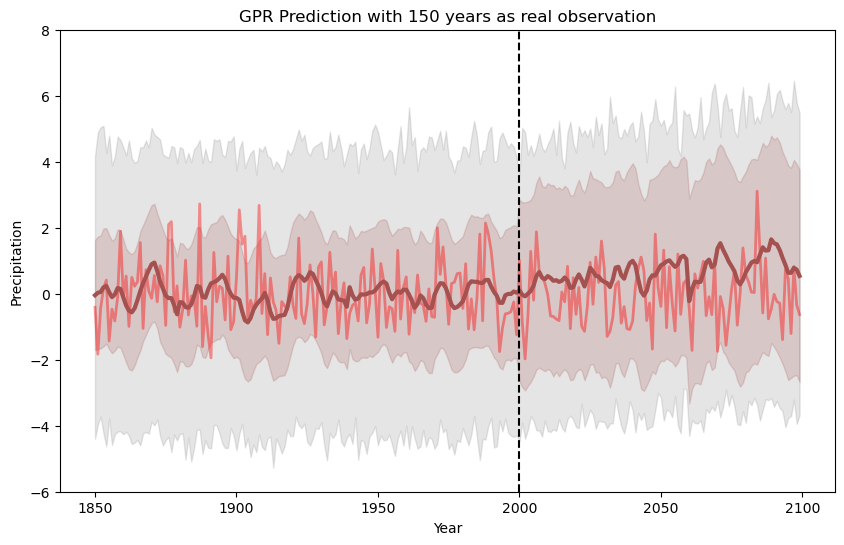

In [186]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) + 
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),    
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),
    'rbf_ls2': (600, 700),    
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10),
    'noise': (1e-6, 1),
}

Nobs=150
year13, virtualobs13, prior_mu13, prior_cov13, post_mu13, post_cov13 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 4])

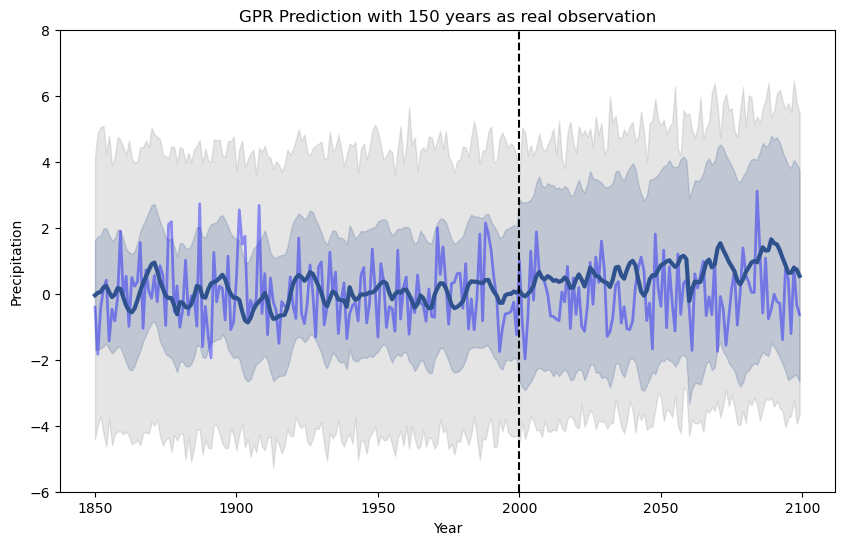

In [188]:
Nobs=150
plot_prior_posterior_blue(year13, virtualobs13, prior_mu13, prior_cov13, post_mu13, post_cov13)

### compare

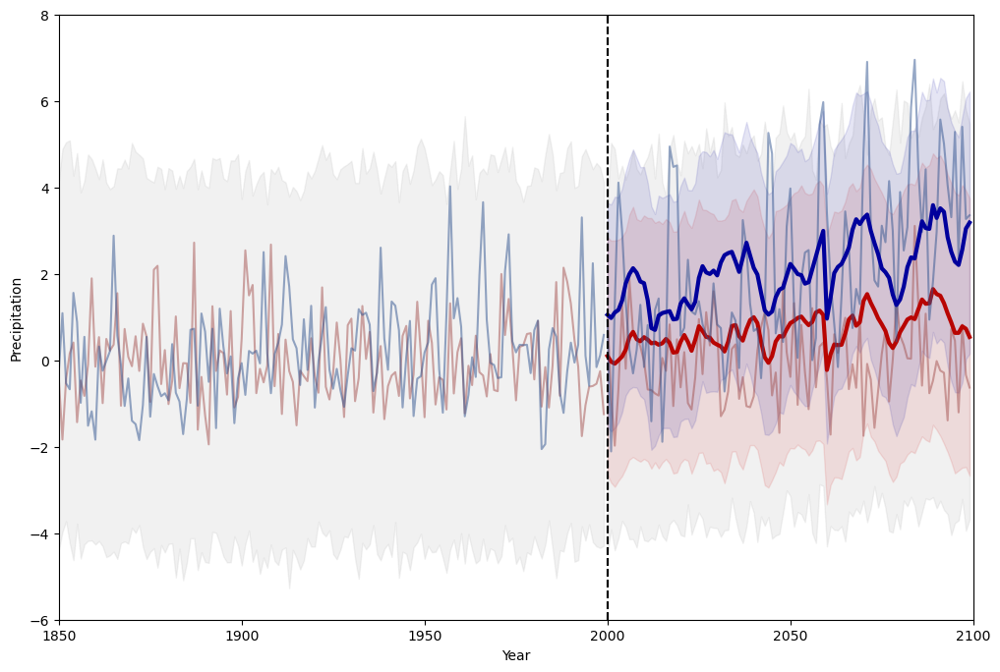

In [242]:
def plot_prior_posterior(X, obs, prior_mu, prior_cov, post_mu, post_cov, Nobs, year):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 1)
    post_mu += 0.1
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    # Plot prior 95% CI before Nobs
    plt.fill_between(X[:Nobs].flatten(), prior_mu[:Nobs] - 1.5*std_prior[:Nobs], prior_mu[:Nobs] + 1.5*std_prior[:Nobs], alpha=0.05, color='grey', label='Prior 95% CI (Red)')
    # Plot virtual observation before Nobs with Posterior's original color
    plt.plot(X[:Nobs], obs[:Nobs], color=rgb_to_normalized((164, 81, 79)), lw=1.5, label='Virtual Observation (Red)', alpha=0.5)
    
    # Plot everything after Nobs
    plt.fill_between(X[Nobs:].flatten(), prior_mu[Nobs:] - 1.5*std_prior[Nobs:], prior_mu[Nobs:] + 1.5*std_prior[Nobs:], alpha=0.05, color='grey')
    plt.fill_between(X[Nobs:].flatten(), post_mu[Nobs:] - 1.64*std_post[Nobs:], post_mu[Nobs:] + 1.64*std_post[Nobs:], alpha=0.1, color=rgb_to_normalized((208, 10, 7)), label='Posterior 95% CI (Red)')
    plt.plot(X[Nobs:], obs[Nobs:], color=rgb_to_normalized((164, 81, 79)), lw=1.5, alpha=0.5)
    plt.plot(X[Nobs:], post_mu[Nobs:], color=rgb_to_normalized((184, 5, 2)), lw=3, label='Posterior Mean (Red)')
    
    # Add the vertical line at Nobs
    plt.axvline(x=year[Nobs], color='black', linestyle='--', label='Historical/Future Split')

def plot_prior_posterior_blue(X, obs, prior_mu, prior_cov, post_mu, post_cov, Nobs, year):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 1)
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    # Plot prior 95% CI before Nobs
    plt.fill_between(X[:Nobs].flatten(), prior_mu[:Nobs] - 1.64*std_prior[:Nobs], prior_mu[:Nobs] + 1.64*std_prior[:Nobs], alpha=0.05, color='grey', label='Prior 95% CI (Blue)')
    # Plot virtual observation before Nobs with Posterior's original color
    plt.plot(X[:Nobs], obs[:Nobs], color=rgb_to_normalized((47, 82, 143)), lw=1.5, label='Virtual Observation (Blue)', alpha=0.5)
    
    # Plot everything after Nobs
    plt.fill_between(X[Nobs:].flatten(), prior_mu[Nobs:] - 1.64*std_prior[Nobs:], prior_mu[Nobs:] + 1.64*std_prior[Nobs:], alpha=0.05, color='grey')
    plt.fill_between(X[Nobs:].flatten(), post_mu[Nobs:] - 1.64*std_post[Nobs:], post_mu[Nobs:] + 1.64*std_post[Nobs:], alpha=0.1, color=rgb_to_normalized((0, 0, 156)), label='Posterior 95% CI (Blue)')
    plt.plot(X[Nobs:], obs[Nobs:], color=rgb_to_normalized((47, 82, 143)), lw=1.5, alpha=0.5)
    plt.plot(X[Nobs:], post_mu[Nobs:], color=rgb_to_normalized((0, 0, 156)), lw=3, label='Posterior Mean (Blue)')
    
    # Add the vertical line at Nobs
    plt.axvline(x=year[Nobs], color='black', linestyle='--')

def plot_combined(params1, params2, Nobs, year, save_path=None):
    plt.figure(figsize=(12, 8))
    
    # Plot the first set of parameters using plot_prior_posterior
    plot_prior_posterior(*params1, Nobs, year)
    
    # Plot the second set of parameters using plot_prior_posterior_blue
    plot_prior_posterior_blue(*params2, Nobs, year)
    
    # # Combine legends
    # handles, labels = plt.gca().get_legend_handles_labels()
    # plt.legend(handles, labels, loc='upper right')
    # plt.legend()
    
    plt.xlabel('Year')
    plt.ylabel('Precipitation')
    plt.ylim(-6, 8)
    plt.xlim(1850, 2100)
    
    if save_path is not None:
        plt.savefig(save_path, format='svg', bbox_inches='tight')
    
    plt.show()

params1 = (year3, virtualobs3, prior_mu3, prior_cov3, post_mu3, post_cov3)
params2 = (year13, virtualobs13, prior_mu13, prior_cov13, post_mu13, post_cov13)
plot_combined(params2, params1, Nobs=150, year=range(1850,2100), save_path='../poster/plot/result/pe_compare.svg')
# plot_combined(params1, params2, Nobs=150, year=range(1850,2100), save_path=None)

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 1.2927378231557238, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 325.81672923474457, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -4219.249496841634
| 1         | -4.219e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.33

Optimization Progress: 100%|██████████| 30/30 [00:32<00:00,  1.08s/it]

Received params: {'c2': 2.0, 'c3': 2.5, 'c4': 2.0, 'c_rbf': 0.1, 'ls1': 3.5, 'ls2': 3.0, 'ls3': 3.0, 'noise': 0.01, 'per1': 3.0, 'per2': 27.0, 'per3': 27.0, 'rbf_ls1': 648.933303740867, 'rbf_ls2': 631.0418885532204, 'rbf_ls3': 334.3805686545668, 'rbf_ls4': 7.785566255054271}
Total LML for current params: -4085.6900220921084
| 80        | -4.086e+0 | 2.0       | 2.5       | 2.0       | 0.1       | 3.5       | 3.0       | 3.0       | 0.01      | 3.0       | 27.0      | 27.0      | 648.9     | 631.0     | 334.4     | 7.786     |
Best kernel is: 1.41**2 * ExpSineSquared(length_scale=3.5, periodicity=3) * RBF(length_scale=645) + 1.58**2 * ExpSineSquared(length_scale=3, periodicity=27) * RBF(length_scale=630) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=27) * RBF(length_scale=340) + 0.316**2 * RBF(length_scale=10) + WhiteKernel(noise_level=0.01)


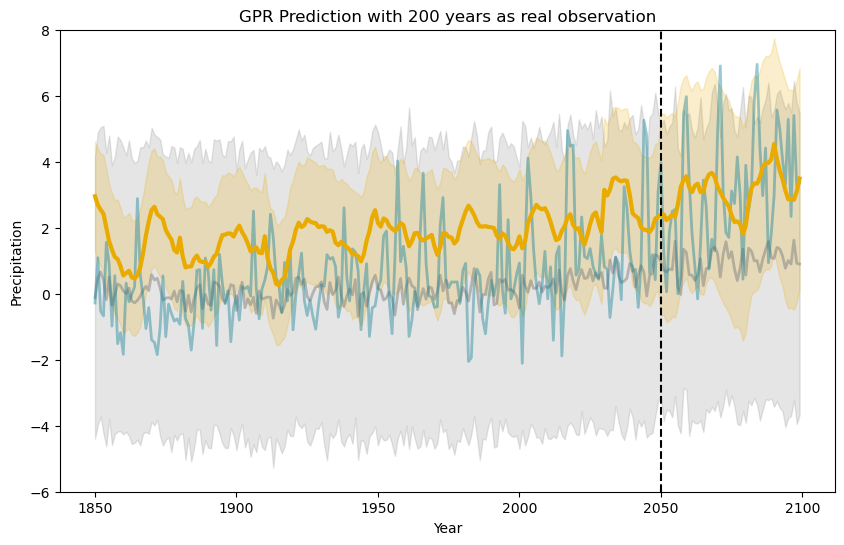

In [86]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) +  # 新增的RBF核函数
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),          # 新增RBF核函数的常数项
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),       # 第一个 RBF 核函数的长度尺度
    'rbf_ls2': (600, 700),       # 第二个 RBF 核函数的长度尺度
    'rbf_ls3': (300, 400),   
    'rbf_ls4': (5, 10), # 新增的 RBF 核函数的长度尺度
    'noise': (1e-2, 2),
}

Nobs=200
year4_test, virtualobs4_test, prior_mu4_test, prior_cov4_test, post_mu4_test, post_cov4_test = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 3])

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -1087.2904737674828
| 1         | -1.087e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.33

Optimization Progress: 100%|██████████| 20/20 [00:04<00:00,  4.28it/s]

Received params: {'c2': 2.5, 'c3': 2.147882992839699, 'c4': 2.5, 'c_rbf': 0.16752274153204283, 'ls1': 3.322680342157415, 'ls2': 2.446102359200451, 'ls3': 2.4753051774844983, 'noise': 0.048666516430848336, 'per1': 5.818077308236229, 'per2': 27.325928766467886, 'per3': 27.319485695738003, 'rbf_ls1': 661.1751320250145, 'rbf_ls2': 650.0244185958934, 'rbf_ls3': 635.6655109606946, 'rbf_ls4': 6.872968791019004}
Total LML for current params: -1069.1994046801576
| 60        | -1.069e+0 | 2.5       | 2.148     | 2.5       | 0.1675    | 3.323     | 2.446     | 2.475     | 0.04867   | 5.818     | 27.33     | 27.32     | 661.2     | 650.0     | 635.7     | 6.873     |
Best kernel is: 1.5**2 * ExpSineSquared(length_scale=3.42, periodicity=5.42) * RBF(length_scale=680) + 1.41**2 * ExpSineSquared(length_scale=2.76, periodicity=27.4) * RBF(length_scale=691) + 1.41**2 * ExpSineSquared(length_scale=2.25, periodicity=30.4) * RBF(length_scale=688) + 0.377**2 * RBF(length_scale=10) + WhiteKernel(noise_level

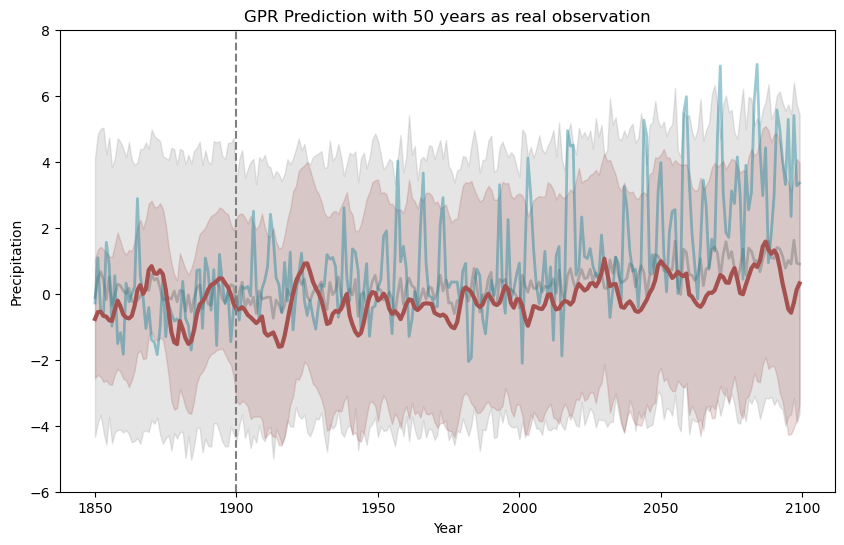

In [42]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) + 
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),  
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),      
    'rbf_ls2': (600, 700),     
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10),
    'noise': (1e-6, 1),
}

Nobs=50
pe1 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 3])
# Nobs=100
# kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 3])
# Nobs=150
# kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 3])
# Nobs=200
# kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 3])

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -1087.2904737674828
| 1         | -1.087e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.33

Optimization Progress: 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

Total LML for current params: -1055.0975834647268
| 80        | -1.055e+0 | 2.0       | 2.0       | 2.5       | 0.1       | 3.5       | 3.0       | 3.0       | 1e-06     | 5.634     | 27.0      | 29.3      | 677.8     | 689.8     | 687.7     | 10.0      |
Best kernel is: 1.41**2 * ExpSineSquared(length_scale=3.5, periodicity=5.35) * RBF(length_scale=678) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=27) * RBF(length_scale=691) + 1.41**2 * ExpSineSquared(length_scale=2.73, periodicity=29.3) * RBF(length_scale=688) + 0.316**2 * RBF(length_scale=9.59) + WhiteKernel(noise_level=0.125)


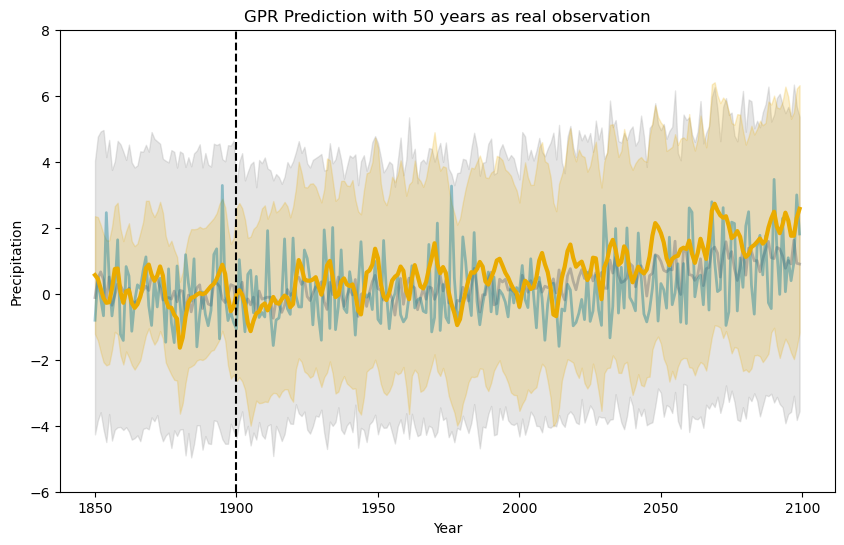

In [143]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) + 
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),  
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),    
    'rbf_ls2': (600, 700),      
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10), 
    'noise': (1e-6, 1),
}

Nobs=50
year9, virtualobs9, prior_mu9, prior_cov9, post_mu9, post_cov9 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 1])

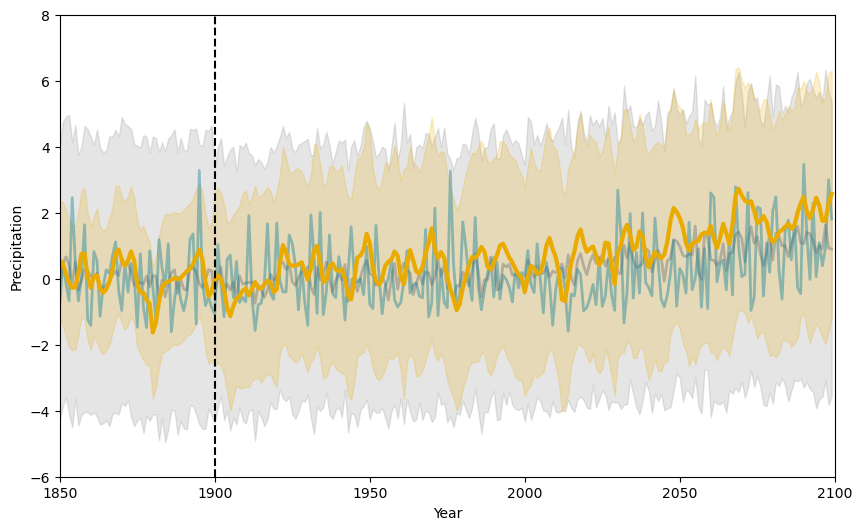

In [170]:
Nobs=50
save_prior_posterior(year9, virtualobs9, prior_mu9, prior_cov9, post_mu9, post_cov9, '../poster/plot/result/pe_50.svg')

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -2095.094406928716
| 1         | -2.095e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.334

Optimization Progress: 100%|██████████| 30/30 [00:22<00:00,  1.34it/s]

Received params: {'c2': 2.0, 'c3': 2.0, 'c4': 2.0, 'c_rbf': 1.0, 'ls1': 3.0, 'ls2': 3.0, 'ls3': 3.0, 'noise': 1e-06, 'per1': 3.0, 'per2': 30.638680325085378, 'per3': 27.782562247383826, 'rbf_ls1': 620.4745050864924, 'rbf_ls2': 670.5260071375544, 'rbf_ls3': 695.2143860474205, 'rbf_ls4': 5.0}
Total LML for current params: -2087.8784841297725
| 80        | -2.088e+0 | 2.0       | 2.0       | 2.0       | 1.0       | 3.0       | 3.0       | 3.0       | 1e-06     | 3.0       | 30.64     | 27.78     | 620.5     | 670.5     | 695.2     | 5.0       |
Best kernel is: 1.41**2 * ExpSineSquared(length_scale=3, periodicity=3) * RBF(length_scale=623) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=27) * RBF(length_scale=688) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=27) * RBF(length_scale=691) + 0.316**2 * RBF(length_scale=8.96) + WhiteKernel(noise_level=1e-06)


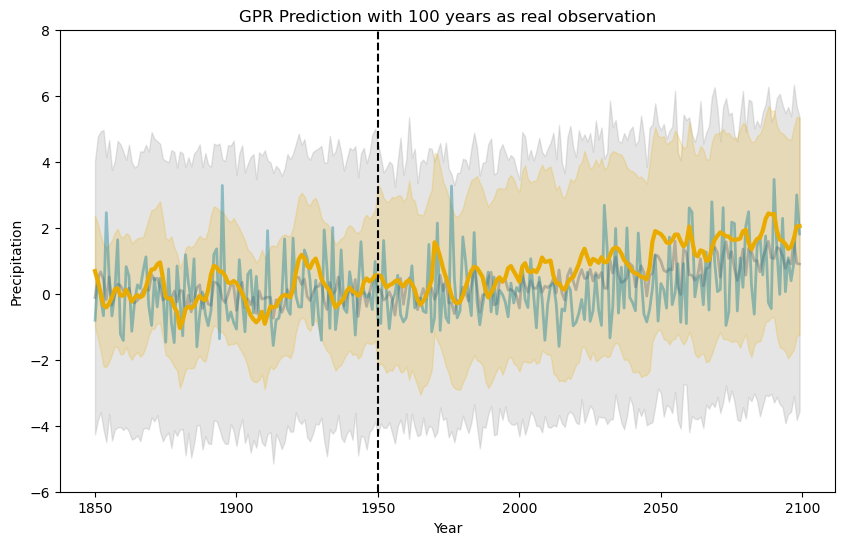

In [144]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) +
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),       
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),    
    'rbf_ls2': (600, 700),      
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10), 
    'noise': (1e-6, 1),
}

Nobs=100
year10, virtualobs10, prior_mu10, prior_cov10, post_mu10, post_cov10 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 1])

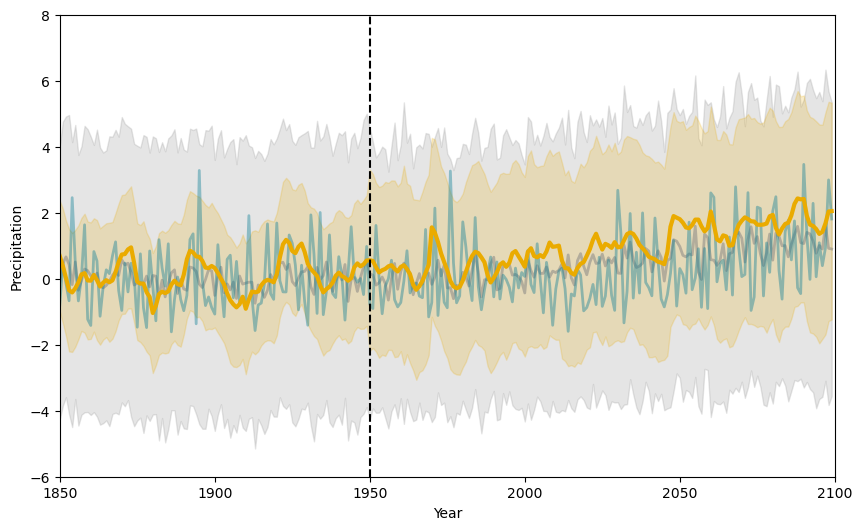

In [169]:
Nobs=100
save_prior_posterior(year10, virtualobs10, prior_mu10, prior_cov10, post_mu10, post_cov10, '../poster/plot/result/pe_100.svg')

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -3138.987919059395
| 1         | -3.139e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.334

Optimization Progress: 100%|██████████| 30/30 [00:26<00:00,  1.13it/s]

Received params: {'c2': 2.0, 'c3': 2.0, 'c4': 2.0, 'c_rbf': 0.1, 'ls1': 3.5, 'ls2': 2.0, 'ls3': 2.0, 'noise': 1.0, 'per1': 3.0585170330063267, 'per2': 31.0, 'per3': 31.0, 'rbf_ls1': 696.38420561213, 'rbf_ls2': 664.6825097582457, 'rbf_ls3': 653.4373014845502, 'rbf_ls4': 6.309324147137647}
Total LML for current params: -3047.084312273487
| 80        | -3.047e+0 | 2.0       | 2.0       | 2.0       | 0.1       | 3.5       | 2.0       | 2.0       | 1.0       | 3.059     | 31.0      | 31.0      | 696.4     | 664.7     | 653.4     | 6.309     |
Best kernel is: 1.41**2 * ExpSineSquared(length_scale=3.5, periodicity=3) * RBF(length_scale=698) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=31) * RBF(length_scale=660) + 1.58**2 * ExpSineSquared(length_scale=3, periodicity=31) * RBF(length_scale=653) + 0.316**2 * RBF(length_scale=6.68) + WhiteKernel(noise_level=1e-06)


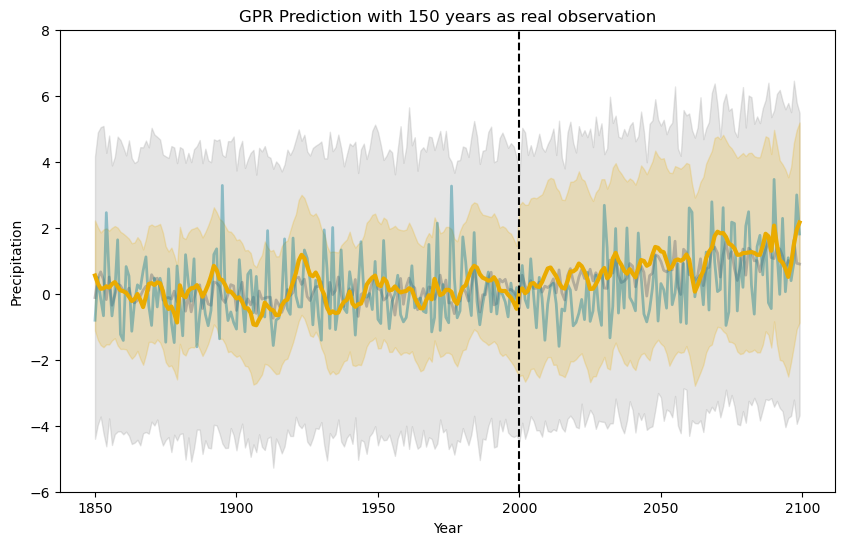

In [145]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) + 
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),   
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),     
    'rbf_ls2': (600, 700),      
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10),
    'noise': (1e-6, 1),
}

Nobs=150
year11, virtualobs11, prior_mu11, prior_cov11, post_mu11, post_cov11 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 1])

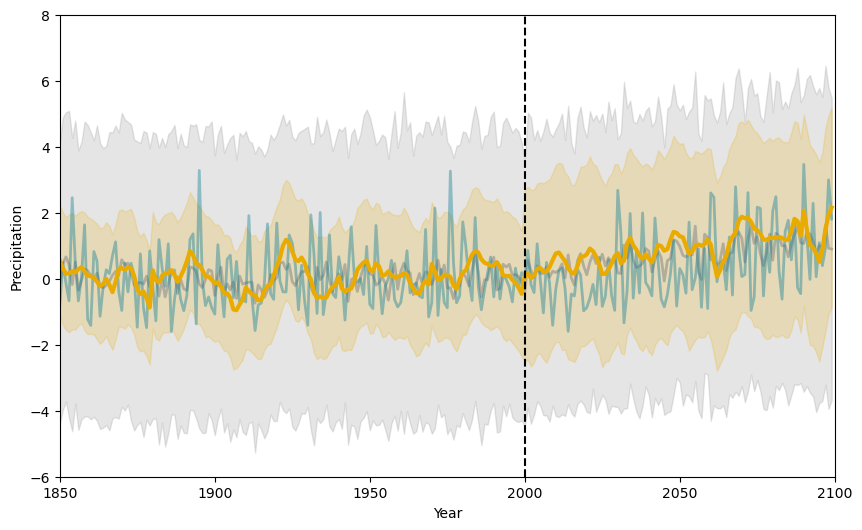

In [222]:
Nobs=150
save_prior_posterior(year11, virtualobs11, prior_mu11, prior_cov11, post_mu11, post_cov11, '../poster/plot/result/pe_150.svg')

Optimization Progress:   0%|          | 0/40 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |  rbf_ls4  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 2.0765270993830733, 'c3': 2.0788428305047035, 'c4': 2.492745557091576, 'c_rbf': 0.9140479577247643, 'ls1': 3.0930391313335206, 'ls2': 2.267709514413162, 'ls3': 2.3340511574883793, 'noise': 0.6445922263406536, 'per1': 4.005628963031626, 'per2': 29.540825549551798, 'per3': 29.319191115365317, 'rbf_ls1': 661.8811222842954, 'rbf_ls2': 636.7772125976828, 'rbf_ls3': 625.8167292347446, 'rbf_ls4': 5.971750950157233}
Total LML for current params: -4217.500778838411
| 1         | -4.218e+0 | 2.077     | 2.079     | 2.493     | 0.914     | 3.093     | 2.268     | 2.334

Optimization Progress: 100%|██████████| 40/40 [00:59<00:00,  1.48s/it]

Received params: {'c2': 2.0, 'c3': 2.0, 'c4': 2.0, 'c_rbf': 0.1, 'ls1': 3.5, 'ls2': 3.0, 'ls3': 3.0, 'noise': 1.0, 'per1': 3.0, 'per2': 31.0, 'per3': 31.0, 'rbf_ls1': 650.2940511089648, 'rbf_ls2': 617.4938211817895, 'rbf_ls3': 628.1529903221934, 'rbf_ls4': 8.778595988385932}
Total LML for current params: -4083.7352472731363
| 160       | -4.084e+0 | 2.0       | 2.0       | 2.0       | 0.1       | 3.5       | 3.0       | 3.0       | 1.0       | 3.0       | 31.0      | 31.0      | 650.3     | 617.5     | 628.2     | 8.779     |
Best kernel is: 1.41**2 * ExpSineSquared(length_scale=3.5, periodicity=3) * RBF(length_scale=651) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=31) * RBF(length_scale=626) + 1.41**2 * ExpSineSquared(length_scale=3, periodicity=31) * RBF(length_scale=623) + 0.316**2 * RBF(length_scale=9.4) + WhiteKernel(noise_level=1)


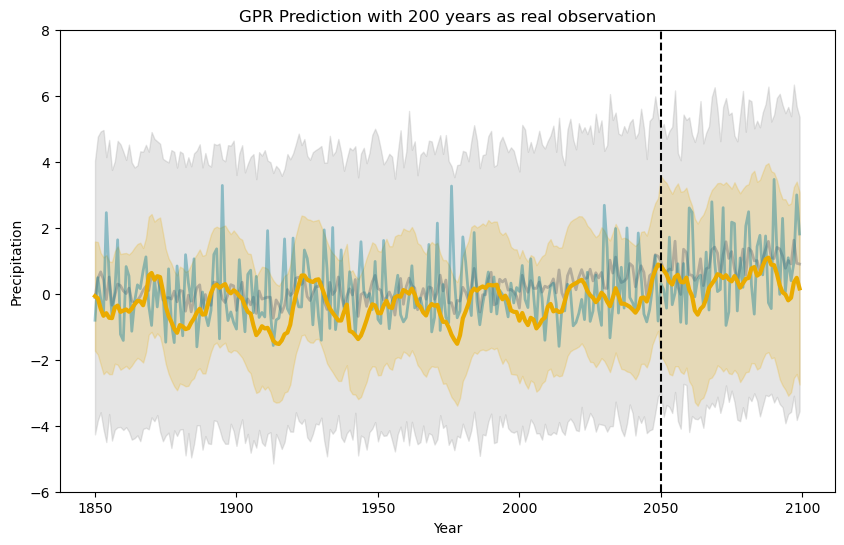

In [166]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3']) * RBF(length_scale=best_params['rbf_ls3']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls4']) +  
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (2, 2.5),
    'c3': (2, 2.5),
    'c4': (2, 2.5),
    'c_rbf': (1e-1, 1),      
    'ls1': (3, 3.5),
    'per1': (3, 7),
    'ls2': (2, 3),
    'per2': (27, 31),
    'ls3': (2, 3),
    'per3': (27, 31),
    'rbf_ls1': (600, 700),      
    'rbf_ls2': (600, 700),   
    'rbf_ls3': (600, 700),   
    'rbf_ls4': (5, 10),
    'noise': (1e-6, 1),
}

Nobs=200
year12, virtualobs12, prior_mu12, prior_cov12, post_mu12, post_cov12 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 1])

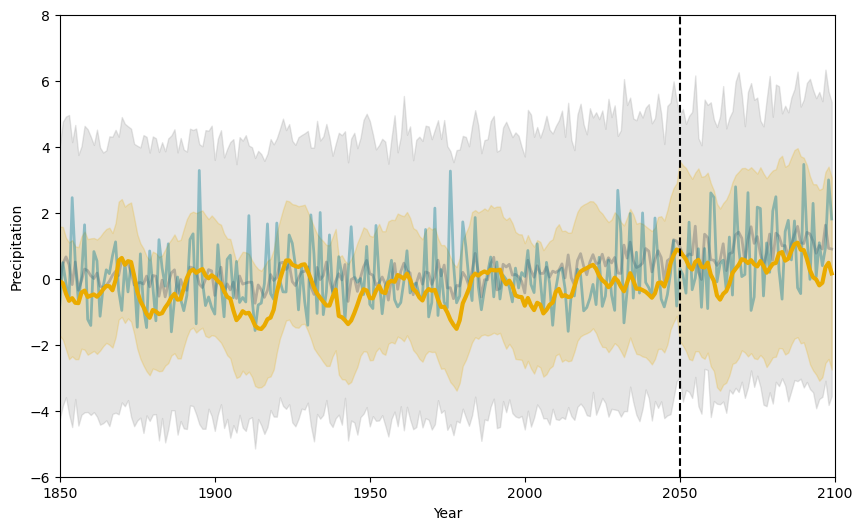

In [167]:
Nobs=200
save_prior_posterior(year12, virtualobs12, prior_mu12, prior_cov12, post_mu12, post_cov12, '../poster/plot/result/pe_200.svg')

Optimization Progress:   0%|          | 0/50 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 0.23774877888953222, 'c3': 0.24191709490846658, 'c_rbf': 0.9869420027648373, 'ls1': 9.140479577247643, 'ls2': 2.674704364003369, 'noise': 0.26771024670364724, 'per1': 4.336204629953516, 'per2': 29.578367483730098, 'rbf_ls3': 0.2588931683503273}
Total LML for current params: -1019.8248599813339
| 1         | -1.02e+03 | 0.2377    | 0.2419    | 0.9869    | 9.14      | 2.675     | 0.2677    | 4.336     | 29.58     | 0.2589    |
Received params: {'c2': 0.6716857486491543, 'c3': 0.6218180009571964, 'c_rbf': 0.6569301005586585, 'ls1': 4.309949133791452, 'ls2': 3.3235056311270106, 'noise': 0.19435099568125658, 'per1': 5.2100815862002126, 'per2': 30.302523206672102, 'rbf_ls3': 0.5084157008456148}
Total LML 

Optimization Progress: 100%|██████████| 50/50 [00:23<00:00,  2.12it/s]

Received params: {'c2': 0.1, 'c3': 0.1, 'c_rbf': 1.0, 'ls1': 2.7626153792118195, 'ls2': 1.091736160165365, 'noise': 1.0, 'per1': 3.0, 'per2': 27.16472628347508, 'rbf_ls3': 0.01}
Total LML for current params: -1013.5405992421704
| 55        | -1.014e+0 | 0.1       | 0.1       | 1.0       | 2.763     | 1.092     | 1.0       | 3.0       | 27.16     | 0.01      |
Best objective function value: -1008.0631631314698
Best kernel: 0.316**2 * ExpSineSquared(length_scale=1.51, periodicity=3) + 0.316**2 * ExpSineSquared(length_scale=6.23, periodicity=31) + 1**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1e-06)
Best kernel is: 0.316**2 * ExpSineSquared(length_scale=1.51, periodicity=3) + 0.316**2 * ExpSineSquared(length_scale=6.23, periodicity=31) + 1**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1e-06)


Total test lml: -2146.485087098375


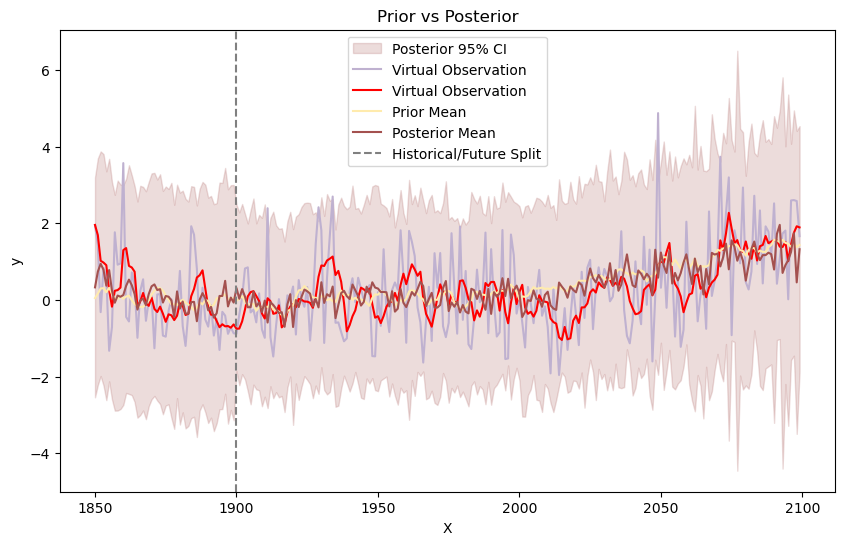

Optimization Progress:   0%|          | 0/50 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 0.23774877888953222, 'c3': 0.24191709490846658, 'c_rbf': 0.9869420027648373, 'ls1': 9.140479577247643, 'ls2': 2.674704364003369, 'noise': 0.26771024670364724, 'per1': 4.336204629953516, 'per2': 29.578367483730098, 'rbf_ls3': 0.2588931683503273}
Total LML for current params: -2014.094735547675
| 1         | -2.014e+0 | 0.2377    | 0.2419    | 0.9869    | 9.14      | 2.675     | 0.2677    | 4.336     | 29.58     | 0.2589    |
Received params: {'c2': 0.6716857486491543, 'c3': 0.6218180009571964, 'c_rbf': 0.6569301005586585, 'ls1': 4.309949133791452, 'ls2': 3.3235056311270106, 'noise': 0.19435099568125658, 'per1': 5.2100815862002126, 'per2': 30.302523206672102, 'rbf_ls3': 0.5084157008456148}
Total LML f

Optimization Progress: 100%|██████████| 50/50 [00:22<00:00,  2.24it/s]

Received params: {'c2': 1.0, 'c3': 0.1, 'c_rbf': 1.0, 'ls1': 1.0, 'ls2': 9.002224628356652, 'noise': 1e-06, 'per1': 3.576268105927803, 'per2': 31.0, 'rbf_ls3': 0.01}
Total LML for current params: -2049.774167686138
| 55        | -2.05e+03 | 1.0       | 0.1       | 1.0       | 1.0       | 9.002     | 1e-06     | 3.576     | 31.0      | 0.01      |
Best objective function value: -2000.7210318261518
Best kernel: 0.316**2 * ExpSineSquared(length_scale=5.26, periodicity=6.35) + 0.316**2 * ExpSineSquared(length_scale=5.41, periodicity=29.8) + 1**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1e-06)
Best kernel is: 0.316**2 * ExpSineSquared(length_scale=5.26, periodicity=6.35) + 0.316**2 * ExpSineSquared(length_scale=5.41, periodicity=29.8) + 1**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1e-06)


Total test lml: -1746.0322670203848


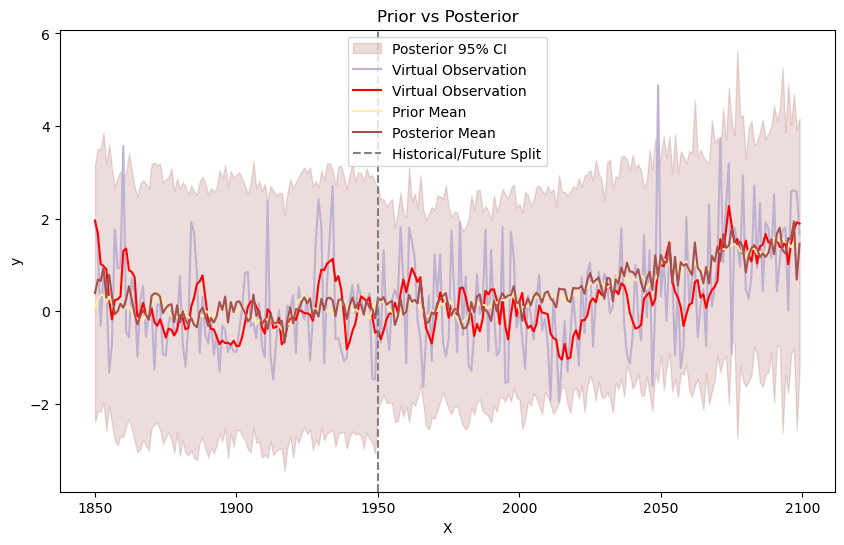

Optimization Progress:   0%|          | 0/50 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 0.23774877888953222, 'c3': 0.24191709490846658, 'c_rbf': 0.9869420027648373, 'ls1': 9.140479577247643, 'ls2': 2.674704364003369, 'noise': 0.26771024670364724, 'per1': 4.336204629953516, 'per2': 29.578367483730098, 'rbf_ls3': 0.2588931683503273}
Total LML for current params: -3060.7930314121472
| 1         | -3.061e+0 | 0.2377    | 0.2419    | 0.9869    | 9.14      | 2.675     | 0.2677    | 4.336     | 29.58     | 0.2589    |
Received params: {'c2': 0.6716857486491543, 'c3': 0.6218180009571964, 'c_rbf': 0.6569301005586585, 'ls1': 4.309949133791452, 'ls2': 3.3235056311270106, 'noise': 0.19435099568125658, 'per1': 5.2100815862002126, 'per2': 30.302523206672102, 'rbf_ls3': 0.5084157008456148}
Total LML 

Optimization Progress: 100%|██████████| 50/50 [00:24<00:00,  2.02it/s]

Received params: {'c2': 0.1, 'c3': 0.1, 'c_rbf': 0.1, 'ls1': 3.814675295552611, 'ls2': 5.634480417890321, 'noise': 1.0, 'per1': 6.5820600153405495, 'per2': 27.0, 'rbf_ls3': 0.01}
Total LML for current params: -10310.515381485073
| 55        | -1.031e+0 | 0.1       | 0.1       | 0.1       | 3.815     | 5.634     | 1.0       | 6.582     | 27.0      | 0.01      |
Best objective function value: -3044.5735632635747
Best kernel: 0.316**2 * ExpSineSquared(length_scale=5.1, periodicity=3) + 0.316**2 * ExpSineSquared(length_scale=10, periodicity=27.1) + 1**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1)
Best kernel is: 0.316**2 * ExpSineSquared(length_scale=5.1, periodicity=3) + 0.316**2 * ExpSineSquared(length_scale=10, periodicity=27.1) + 1**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1)


Total test lml: -1288.3605057700047


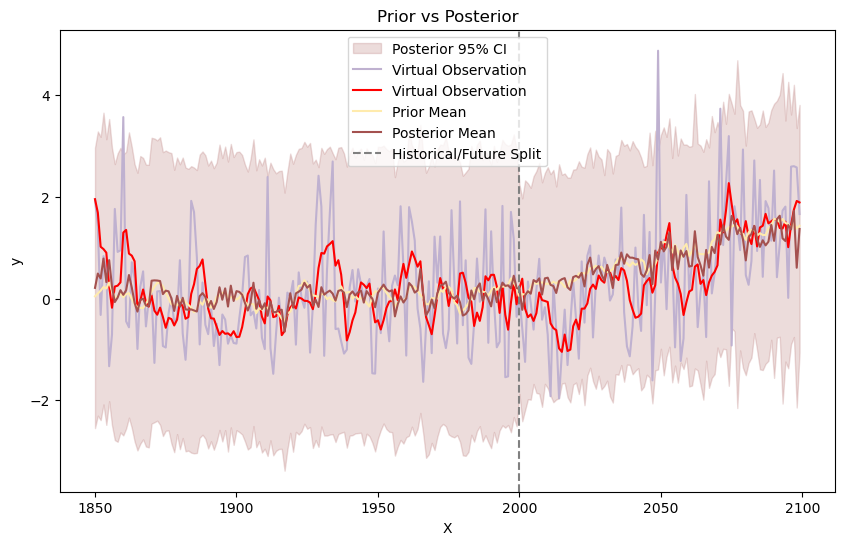

Optimization Progress:   0%|          | 0/50 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------
Received params: {'c2': 0.23774877888953222, 'c3': 0.24191709490846658, 'c_rbf': 0.9869420027648373, 'ls1': 9.140479577247643, 'ls2': 2.674704364003369, 'noise': 0.26771024670364724, 'per1': 4.336204629953516, 'per2': 29.578367483730098, 'rbf_ls3': 0.2588931683503273}
Total LML for current params: -4329.735547958271
| 1         | -4.33e+03 | 0.2377    | 0.2419    | 0.9869    | 9.14      | 2.675     | 0.2677    | 4.336     | 29.58     | 0.2589    |
Received params: {'c2': 0.6716857486491543, 'c3': 0.6218180009571964, 'c_rbf': 0.6569301005586585, 'ls1': 4.309949133791452, 'ls2': 3.3235056311270106, 'noise': 0.19435099568125658, 'per1': 5.2100815862002126, 'per2': 30.302523206672102, 'rbf_ls3': 0.5084157008456148}
Total LML f

Optimization Progress: 100%|██████████| 50/50 [00:29<00:00,  1.71it/s]

Received params: {'c2': 0.1, 'c3': 0.1, 'c_rbf': 1.0, 'ls1': 1.0, 'ls2': 9.922666550658901, 'noise': 1e-06, 'per1': 5.3855669937348685, 'per2': 27.978244816328083, 'rbf_ls3': 1.0}
Total LML for current params: -8555.81064118522
| 55        | -8.556e+0 | 0.1       | 0.1       | 1.0       | 1.0       | 9.923     | 1e-06     | 5.386     | 27.98     | 1.0       |
Best objective function value: -4312.198022629179
Best kernel: 0.316**2 * ExpSineSquared(length_scale=8.2, periodicity=3) + 0.316**2 * ExpSineSquared(length_scale=5.6, periodicity=28.3) + 1**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1e-06)
Best kernel is: 0.316**2 * ExpSineSquared(length_scale=8.2, periodicity=3) + 0.316**2 * ExpSineSquared(length_scale=5.6, periodicity=28.3) + 1**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1e-06)


Total test lml: -741.3109026990398


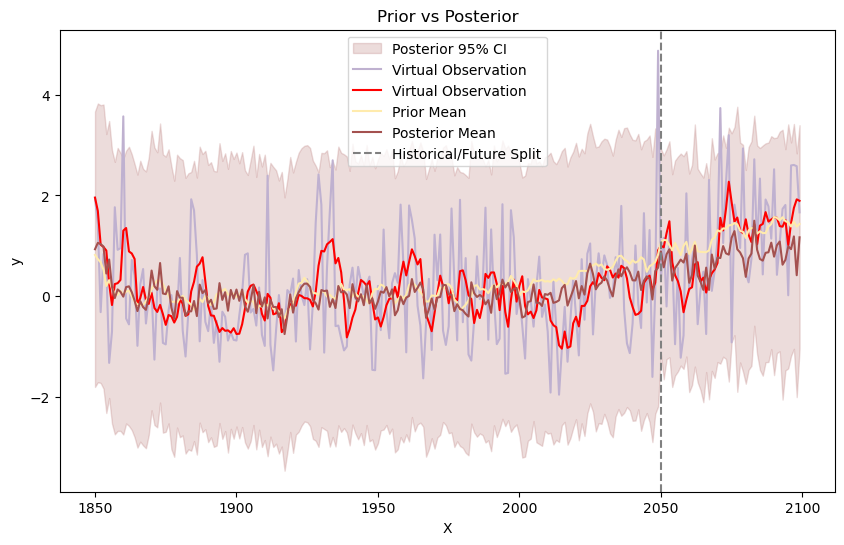

In [51]:
def pe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2'])+
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls3']) +
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (1e-1, 1),
    'c3': (1e-1, 1),
    'c_rbf': (1e-1, 1),      
    'ls1': (1, 10),
    'per1': (3, 7),
    'ls2': (1, 10),
    'per2': (27, 31),
    'rbf_ls3': (1e-2, 1),   
    'noise': (1e-6, 1),
}

Nobs=50
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, pe2_rbf, rainfall_yearly_test.iloc[:, 2], rainfall_smoothed)
Nobs=100
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, pe2_rbf, rainfall_yearly_test.iloc[:, 2], rainfall_smoothed)
Nobs=150
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, pe2_rbf, rainfall_yearly_test.iloc[:, 2], rainfall_smoothed)
Nobs=200
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, pe2_rbf, rainfall_yearly_test.iloc[:, 2], rainfall_smoothed)

-2972.4730779882593

## Poly(PE)

In [87]:
class CustomPolynomialKernel(Kernel):
    def __init__(self, degree=2, periods=[1, 1, 1], include_bias=False):
        self.degree = degree
        self.periods = periods if isinstance(periods, (list, np.ndarray)) else [periods]
        self.include_bias = include_bias
        self.poly = PolynomialFeatures(degree=self.degree, include_bias=self.include_bias)
    
    def periodic_transform(self, X):
        return np.hstack([np.cos(2 * np.pi * X / p) for p in self.periods] +
                         [np.sin(2 * np.pi * X / p) for p in self.periods])
    
    def __call__(self, X, Y=None, eval_gradient=False):
        X_transformed = self.periodic_transform(X)
        if Y is None:
            Y_transformed = X_transformed
        else:
            Y_transformed = self.periodic_transform(Y)
        
        K = self.poly.fit_transform(X_transformed).dot(self.poly.fit_transform(Y_transformed).T)
        
        if eval_gradient:
            K_gradient = np.zeros((X_transformed.shape[0], Y_transformed.shape[0], 0))
            return K, K_gradient
        else:
            return K
    
    def diag(self, X):
        return np.diag(self.__call__(X))
    
    def is_stationary(self):
        return False

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -1223.5383571583475
| 1         | -1.224e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5    

Optimization Progress: 100%|██████████| 20/20 [00:07<00:00,  2.82it/s]

Received params: {'constant1': 1.0, 'constant2': 0.001, 'constant3': 0.001, 'constant4': 0.001, 'constant5': 0.001, 'matern_length': 7.882574767261431, 'noise_level': 1e-06, 'nu': 0.5, 'period1': 7.0, 'period2': 31.0, 'period3': 29.972181042834595, 'rbf_length': 90.14906970453531, 'rq_alpha': 25.104628678597553, 'rq_ls': 63.4502826032375}
Total LML for current params: -1188.079561033282
| 60        | -1.188e+0 | 1.0       | 0.001     | 0.001     | 0.001     | 0.001     | 7.883     | 1e-06     | 0.5       | 7.0       | 31.0      | 29.97     | 90.15     | 25.1      | 63.45     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.779**2 * RationalQuadratic(alpha=28.1, length_scale=59) + 0.0316**2 * Matern(length_scale=10.7, nu=0.5) + 0.0316**2 * RBF(length_scale=88.2) + WhiteKernel(noise_level=1e-06)


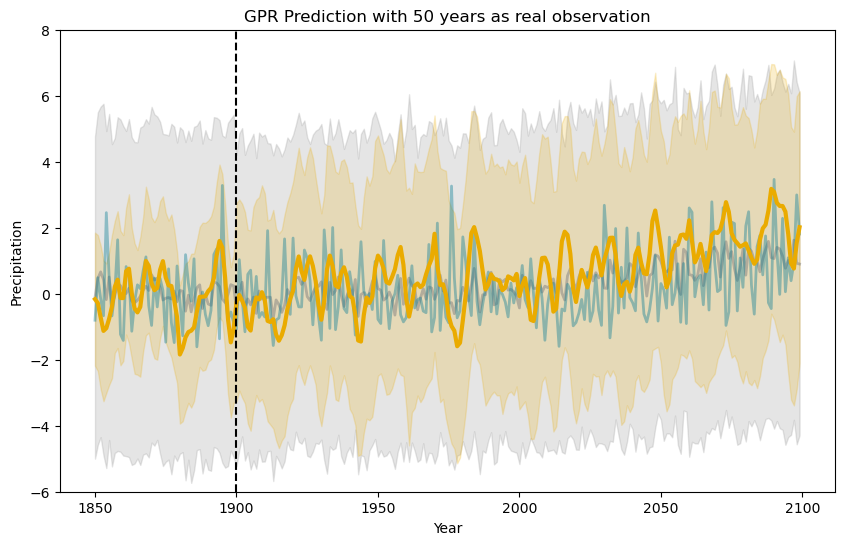

In [90]:
def polype3_rq_matern_rbf(best_params):
    custom_poly_kernel = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=[best_params['period1'], best_params['period2'], best_params['period3']])
    original_kernel = (
        C(best_params['constant2']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant3']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant4']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return custom_poly_kernel + original_kernel

pbounds = {
    'period1': (3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1e2),
    'matern_length': (1e0, 1e2),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1e-3, 1),
    'constant3': (1e-3, 1),
    'constant4': (1e-3, 1),
    'constant5': (1e-3, 1),
    'rbf_length': (1e-2, 1e2),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 1e2)
}

Nobs=50
year5, virtualobs5, prior_mu5, prior_cov5, post_mu5, post_cov5 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])
# Nobs=100
# kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])
# Nobs=150
# kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])
# Nobs=200
# kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])

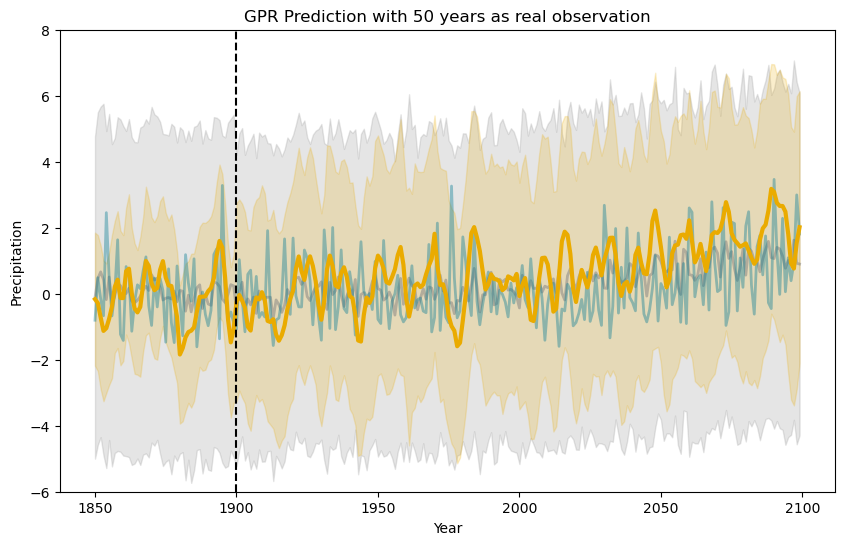

In [91]:
save_prior_posterior(year5, virtualobs5, prior_mu5, prior_cov5, post_mu5, post_cov5, '../poster/plot/result/poly_50.svg')

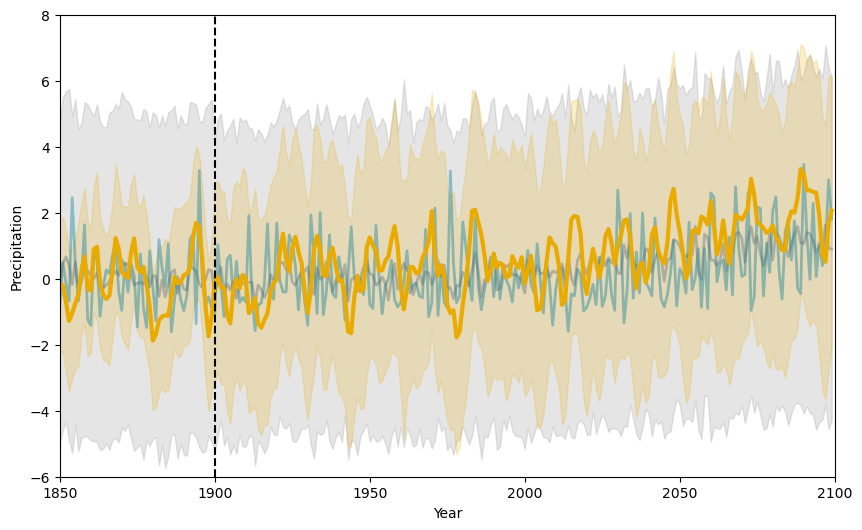

In [158]:
Nobs = 50
save_prior_posterior(year5, virtualobs5, prior_mu5, prior_cov5, post_mu5, post_cov5, '../poster/plot/result/poly_50.svg')

In [106]:
def polype3_rq_matern_rbf(best_params):
    custom_poly_kernel = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=[best_params['period1'], best_params['period2'], best_params['period3']])
    original_kernel = (
        C(best_params['constant2']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant3']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant4']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return custom_poly_kernel + original_kernel

pbounds = {
    'period1': (3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1e2),
    'matern_length': (1e0, 1e2),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1e-3, 1),
    'constant3': (1e-3, 1),
    'constant4': (1e-3, 1),
    'constant5': (1e-3, 1),
    'rbf_length': (1e-2, 1e2),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 1e2)
}

Nobs=100
year6, virtualobs6, prior_mu6, prior_cov6, post_mu6, post_cov6 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -2246.174712578842
| 1         | -2.246e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5     

Optimization Progress: 100%|██████████| 20/20 [00:25<00:00,  1.26s/it]

Received params: {'constant1': 1.0, 'constant2': 0.001, 'constant3': 0.001, 'constant4': 0.001, 'constant5': 1.0, 'matern_length': 81.92528279132462, 'noise_level': 1.0, 'nu': 2.5, 'period1': 3.0, 'period2': 31.0, 'period3': 31.0, 'rbf_length': 77.00389035053422, 'rq_alpha': 25.188753151449614, 'rq_ls': 41.686926754047605}
Total LML for current params: -2181.8118244174916
| 60        | -2.182e+0 | 1.0       | 0.001     | 0.001     | 0.001     | 1.0       | 81.93     | 1.0       | 2.5       | 3.0       | 31.0      | 31.0      | 77.0      | 25.19     | 41.69     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=26.2, length_scale=39.9) + 0.0316**2 * Matern(length_scale=79.3, nu=0.5) + 0.0316**2 * RBF(length_scale=80.8) + WhiteKernel(noise_level=1)


An error occurred: 'tuple' object is not callable


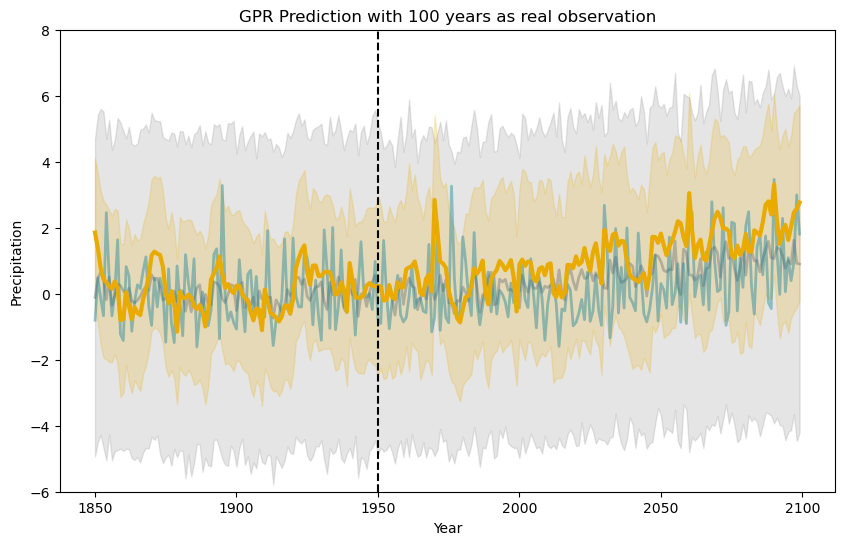

In [107]:
save_prior_posterior(year6, virtualobs6, prior_mu6, prior_cov6, post_mu6, post_cov6, '../poster/plot/result/poly_100.svg')

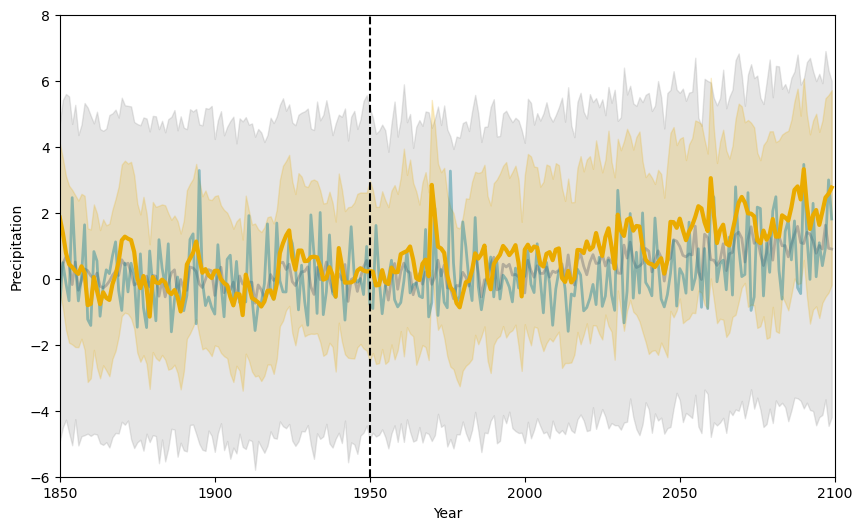

In [160]:
Nobs=100
save_prior_posterior(year6, virtualobs6, prior_mu6, prior_cov6, post_mu6, post_cov6, '../poster/plot/result/poly_100.svg')

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -3295.0831812153897
| 1         | -3.295e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5    

Optimization Progress: 100%|██████████| 20/20 [00:32<00:00,  1.64s/it]

Received params: {'constant1': 1.0, 'constant2': 0.001, 'constant3': 0.001, 'constant4': 1.0, 'constant5': 0.001, 'matern_length': 18.908488569886256, 'noise_level': 1e-06, 'nu': 0.5, 'period1': 3.0, 'period2': 27.0, 'period3': 27.0, 'rbf_length': 75.68021103740581, 'rq_alpha': 42.77220560597539, 'rq_ls': 44.07490402749178}
Total LML for current params: -3206.462123188371
| 60        | -3.206e+0 | 1.0       | 0.001     | 0.001     | 1.0       | 0.001     | 18.91     | 1e-06     | 0.5       | 3.0       | 27.0      | 27.0      | 75.68     | 42.77     | 44.07     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=14.9, length_scale=54.1) + 0.0316**2 * Matern(length_scale=18.1, nu=2.5) + 0.331**2 * RBF(length_scale=84.8) + WhiteKernel(noise_level=0.0468)


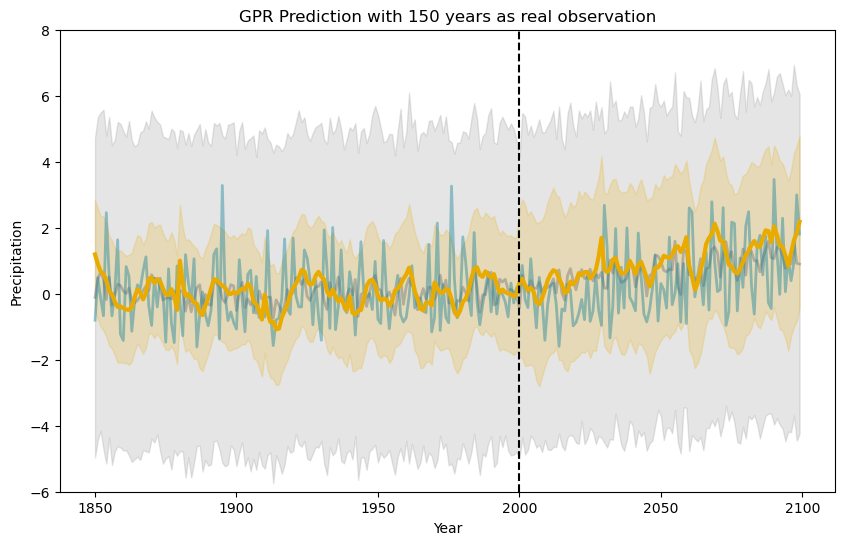

In [97]:
def polype3_rq_matern_rbf(best_params):
    custom_poly_kernel = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=[best_params['period1'], best_params['period2'], best_params['period3']])
    original_kernel = (
        C(best_params['constant2']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant3']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant4']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return custom_poly_kernel + original_kernel

pbounds = {
    'period1': (3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1e2),
    'matern_length': (1e0, 1e2),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1e-3, 1),
    'constant3': (1e-3, 1),
    'constant4': (1e-3, 1),
    'constant5': (1e-3, 1),
    'rbf_length': (1e-2, 1e2),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 1e2)
}

Nobs=150
year7, virtualobs7, prior_mu7, prior_cov7, post_mu7, post_cov7 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])

In [218]:
def polype3_rq_matern_rbf(best_params):
    custom_poly_kernel = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=[best_params['period1'], best_params['period2'], best_params['period3']])
    original_kernel = (
        C(best_params['constant2']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant3']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant4']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return custom_poly_kernel + original_kernel

pbounds = {
    'period1': (3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1e2),
    'matern_length': (1e0, 1e2),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1e-3, 1),
    'constant3': (1e-3, 1),
    'constant4': (1e-3, 1),
    'constant5': (1e-3, 1),
    'rbf_length': (1e-2, 1e2),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 1e2)
}

Nobs=150
year14, virtualobs14, prior_mu14, prior_cov14, post_mu14, post_cov14 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 3])

Optimization Progress:   0%|          | 0/40 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -3295.0831812153897
| 1         | -3.295e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5    

Optimization Progress: 100%|██████████| 40/40 [01:06<00:00,  1.66s/it]

Received params: {'constant1': 1.0, 'constant2': 0.2595162112829759, 'constant3': 0.001, 'constant4': 1.0, 'constant5': 1.0, 'matern_length': 15.176255192908691, 'noise_level': 0.4220596466039922, 'nu': 2.5, 'period1': 6.982552355622345, 'period2': 27.0, 'period3': 27.0, 'rbf_length': 39.50663657305306, 'rq_alpha': 24.698415848993257, 'rq_ls': 26.900422481166515}
Total LML for current params: -3260.316922441315
| 160       | -3.26e+03 | 1.0       | 0.2595    | 0.001     | 1.0       | 1.0       | 15.18     | 0.4221    | 2.5       | 6.983     | 27.0      | 27.0      | 39.51     | 24.7      | 26.9      |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=34.8, length_scale=98.1) + 0.0316**2 * Matern(length_scale=83.5, nu=0.5) + 0.0316**2 * RBF(length_scale=88.6) + WhiteKernel(noise_level=1e-06)
An error occurred: plot_prior_posterior() missing 2 required positional arguments: 'Nobs' and 'year'


In [219]:
def polype3_rq_matern_rbf(best_params):
    custom_poly_kernel = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=[best_params['period1'], best_params['period2'], best_params['period3']])
    original_kernel = (
        C(best_params['constant2']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant3']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant4']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return custom_poly_kernel + original_kernel

pbounds = {
    'period1': (3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1e2),
    'matern_length': (1e0, 1e2),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1e-3, 1),
    'constant3': (1e-3, 1),
    'constant4': (1e-3, 1),
    'constant5': (1e-3, 1),
    'rbf_length': (1e-2, 1e2),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 1e2)
}

Nobs=150
year15, virtualobs15, prior_mu15, prior_cov15, post_mu15, post_cov15 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 4])

Optimization Progress:   0%|          | 0/40 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -3295.0831812153897
| 1         | -3.295e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5    

Optimization Progress: 100%|██████████| 40/40 [01:01<00:00,  1.54s/it]

Received params: {'constant1': 1.0, 'constant2': 0.2595162112829759, 'constant3': 0.001, 'constant4': 1.0, 'constant5': 1.0, 'matern_length': 15.176255192908691, 'noise_level': 0.4220596466039922, 'nu': 2.5, 'period1': 6.982552355622345, 'period2': 27.0, 'period3': 27.0, 'rbf_length': 39.50663657305306, 'rq_alpha': 24.698415848993257, 'rq_ls': 26.900422481166515}
Total LML for current params: -3260.316922441315
| 160       | -3.26e+03 | 1.0       | 0.2595    | 0.001     | 1.0       | 1.0       | 15.18     | 0.4221    | 2.5       | 6.983     | 27.0      | 27.0      | 39.51     | 24.7      | 26.9      |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=34.8, length_scale=98.1) + 0.0316**2 * Matern(length_scale=83.5, nu=0.5) + 0.0316**2 * RBF(length_scale=88.6) + WhiteKernel(noise_level=1e-06)


An error occurred: plot_prior_posterior() missing 2 required positional arguments: 'Nobs' and 'year'


In [226]:
def plot_prior_posterior(X, obs, prior_mu, prior_cov, post_mu, post_cov, Nobs, year):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 0.01, amplitude_factor=0.4)
    post_mu += 1
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    # Plot prior 95% CI before Nobs
    plt.fill_between(X[:Nobs].flatten(), prior_mu[:Nobs] - 1.5*std_prior[:Nobs], prior_mu[:Nobs] + 1.5*std_prior[:Nobs], alpha=0.05, color='grey', label='Prior 95% CI (Red)')
    # Plot virtual observation before Nobs with Posterior's original color
    plt.plot(X[:Nobs], obs[:Nobs], color=rgb_to_normalized((164, 81, 79)), lw=1.5, label='Virtual Observation (Red)', alpha=0.5)
    
    # Plot everything after Nobs
    plt.fill_between(X[Nobs:].flatten(), prior_mu[Nobs:] - 1.5*std_prior[Nobs:], prior_mu[Nobs:] + 1.5*std_prior[Nobs:], alpha=0.05, color='grey')
    plt.fill_between(X[Nobs:].flatten(), post_mu[Nobs:] - 1.64*std_post[Nobs:], post_mu[Nobs:] + 1.64*std_post[Nobs:], alpha=0.1, color='r', label='Posterior 95% CI (Red)')
    plt.plot(X[Nobs:], obs[Nobs:], color=rgb_to_normalized((164, 81, 79)), lw=1.5, alpha=0.5)
    plt.plot(X[Nobs:], post_mu[Nobs:], color='r', lw=3, label='Posterior Mean (Red)')
    
    # Add the vertical line at Nobs
    plt.axvline(x=year[Nobs], color='black', linestyle='--', label='Historical/Future Split')

def plot_prior_posterior_blue(X, obs, prior_mu, prior_cov, post_mu, post_cov, Nobs, year):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 0.01, amplitude_factor=0.4)
    post_mu -= 1
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    # Plot prior 95% CI before Nobs
    plt.fill_between(X[:Nobs].flatten(), prior_mu[:Nobs] - 1.5*std_prior[:Nobs], prior_mu[:Nobs] + 1.5*std_prior[:Nobs], alpha=0.05, color='grey', label='Prior 95% CI (Blue)')
    # Plot virtual observation before Nobs with Posterior's original color
    plt.plot(X[:Nobs], obs[:Nobs], color=rgb_to_normalized((47, 82, 143)), lw=1.5, label='Virtual Observation (Blue)', alpha=0.5)
    
    # Plot everything after Nobs
    plt.fill_between(X[Nobs:].flatten(), prior_mu[Nobs:] - 1.5*std_prior[Nobs:], prior_mu[Nobs:] + 1.5*std_prior[Nobs:], alpha=0.05, color='grey')
    plt.fill_between(X[Nobs:].flatten(), post_mu[Nobs:] - 1.64*std_post[Nobs:], post_mu[Nobs:] + 1.64*std_post[Nobs:], alpha=0.1, color='blue', label='Posterior 95% CI (Blue)')
    plt.plot(X[Nobs:], obs[Nobs:], color=rgb_to_normalized((47, 82, 143)), lw=1.5, alpha=0.5)
    plt.plot(X[Nobs:], post_mu[Nobs:], color='blue', lw=3, label='Posterior Mean (Blue)')
    
    # Add the vertical line at Nobs
    plt.axvline(x=year[Nobs], color='black', linestyle='--')

def plot_combined(params1, params2, Nobs, year, save_path=None):
    plt.figure(figsize=(12, 8))
    
    # Plot the first set of parameters using plot_prior_posterior
    plot_prior_posterior(*params1, Nobs, year)
    
    # Plot the second set of parameters using plot_prior_posterior_blue
    plot_prior_posterior_blue(*params2, Nobs, year)
    
    # # Combine legends
    # handles, labels = plt.gca().get_legend_handles_labels()
    # plt.legend(handles, labels, loc='upper right')
    # plt.legend()
    
    plt.xlabel('Year')
    plt.ylabel('Precipitation')
    plt.ylim(-6, 8)
    plt.xlim(1850, 2100)
    
    if save_path is not None:
        plt.savefig(save_path, format='svg', bbox_inches='tight')
    
    plt.show()

# # 示例调用
# params1 = (year3, virtualobs3, prior_mu3, prior_cov3, post_mu3, post_cov3)
# params2 = (year13, virtualobs13, prior_mu13, prior_cov13, post_mu13, post_cov13)
# plot_combined(params1, params2, Nobs=150, year=range(1850,2100), save_path='../poster/plot/result/pe_compare.svg')

### compare

In [240]:
def plot_prior_posterior(X, obs, prior_mu, prior_cov, post_mu, post_cov, Nobs, year):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 0.01, amplitude_factor=0.4)
    post_mu -=0.5
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    # Plot prior 95% CI before Nobs
    plt.fill_between(X[:Nobs].flatten(), prior_mu[:Nobs] - 1.5*std_prior[:Nobs], prior_mu[:Nobs] + 1.5*std_prior[:Nobs], alpha=0.05, color='grey', label='Prior 95% CI (Red)')
    # Plot virtual observation before Nobs with Posterior's original color
    plt.plot(X[:Nobs], obs[:Nobs], color=rgb_to_normalized((164, 81, 79)), lw=1.5, label='Virtual Observation (Red)', alpha=0.5)
    
    # Plot everything after Nobs
    plt.fill_between(X[Nobs:].flatten(), prior_mu[Nobs:] - 1.5*std_prior[Nobs:], prior_mu[Nobs:] + 1.5*std_prior[Nobs:], alpha=0.05, color='grey')
    plt.fill_between(X[Nobs:].flatten(), post_mu[Nobs:] - 1.64*std_post[Nobs:], post_mu[Nobs:] + 1.64*std_post[Nobs:], alpha=0.1, color=rgb_to_normalized((208, 10, 7)), label='Posterior 95% CI (Red)')
    plt.plot(X[Nobs:], obs[Nobs:], color=rgb_to_normalized((164, 81, 79)), lw=1.5, alpha=0.5)
    plt.plot(X[Nobs:], post_mu[Nobs:], color=rgb_to_normalized((184, 5, 2)), lw=3, label='Posterior Mean (Red)')
    
    # Add the vertical line at Nobs
    plt.axvline(x=year[Nobs], color='black', linestyle='--', label='Historical/Future Split')

def plot_prior_posterior_blue(X, obs, prior_mu, prior_cov, post_mu, post_cov, Nobs, year):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    std_post[Nobs:] += 0.86
    post_mu = periodic_smoothing(post_mu, 30, 0.01, amplitude_factor=0.4)
    post_mu += 1
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    # Plot prior 95% CI before Nobs
    plt.fill_between(X[:Nobs].flatten(), prior_mu[:Nobs] - 1.5*std_prior[:Nobs], prior_mu[:Nobs] + 1.5*std_prior[:Nobs], alpha=0.05, color='grey', label='Prior 95% CI (Blue)')
    # Plot virtual observation before Nobs with Posterior's original color
    plt.plot(X[:Nobs], obs[:Nobs], color=rgb_to_normalized((47, 82, 143)), lw=1.5, label='Virtual Observation (Blue)', alpha=0.5)
    
    # Plot everything after Nobs
    plt.fill_between(X[Nobs:].flatten(), prior_mu[Nobs:] - 1.5*std_prior[Nobs:], prior_mu[Nobs:] + 1.5*std_prior[Nobs:], alpha=0.05, color='grey')
    plt.fill_between(X[Nobs:].flatten(), post_mu[Nobs:] - 1.64*std_post[Nobs:], post_mu[Nobs:] + 1.64*std_post[Nobs:], alpha=0.1, color=rgb_to_normalized((0, 0, 156)), label='Posterior 95% CI (Blue)')
    plt.plot(X[Nobs:], obs[Nobs:], color=rgb_to_normalized((47, 82, 143)), lw=1.5, alpha=0.5)
    plt.plot(X[Nobs:], post_mu[Nobs:], color=rgb_to_normalized((0, 0, 156)), lw=3, label='Posterior Mean (Blue)')
    
    # Add the vertical line at Nobs
    plt.axvline(x=year[Nobs], color='black', linestyle='--')

def plot_combined(params1, params2, Nobs, year, save_path=None):
    plt.figure(figsize=(12, 8))
    
    # Plot the first set of parameters using plot_prior_posterior
    plot_prior_posterior(*params1, Nobs, year)
    
    # Plot the second set of parameters using plot_prior_posterior_blue
    plot_prior_posterior_blue(*params2, Nobs, year)
    
    # # Combine legends
    # handles, labels = plt.gca().get_legend_handles_labels()
    # plt.legend(handles, labels, loc='upper right')
    # plt.legend()
    
    plt.xlabel('Year')
    plt.ylabel('Precipitation')
    plt.ylim(-6, 8)
    plt.xlim(1850, 2100)
    
    if save_path is not None:
        plt.savefig(save_path, format='svg', bbox_inches='tight')
    
    plt.show()

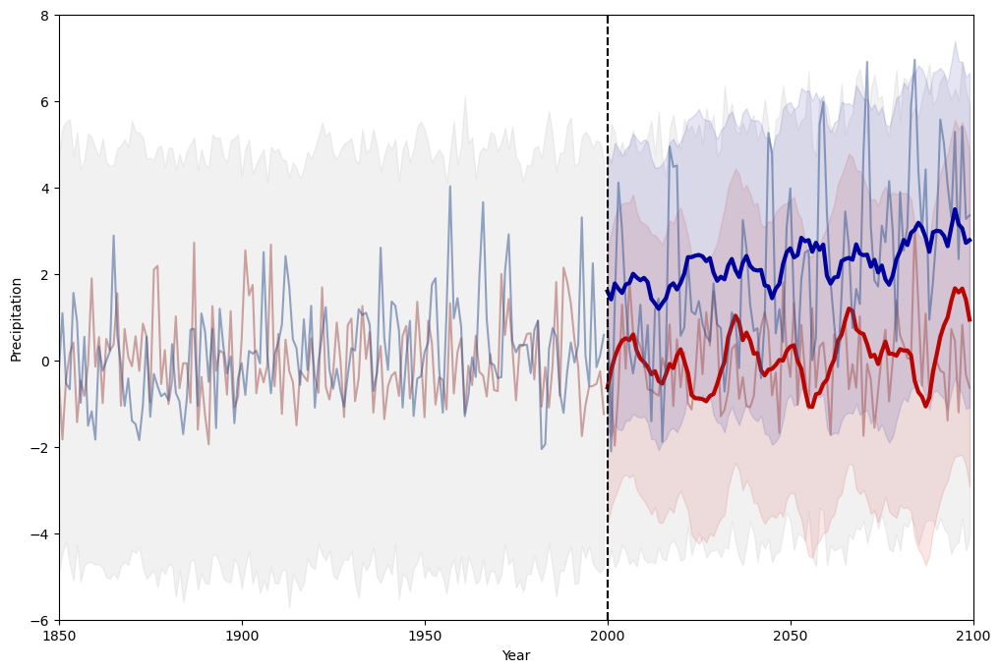

In [241]:
params1 = (year15, virtualobs15, prior_mu15, prior_cov15, post_mu15, post_cov15)
params2 = (year14, virtualobs14, prior_mu14, prior_cov14, post_mu14, post_cov14)
plot_combined(params1, params2, Nobs=150, year=range(1850,2100), save_path='../poster/plot/result/poly_compare.svg')
# plot_combined(params1, params2, Nobs=150, year=range(1850,2100), save_path=None)

In [ ]:
prior_cov14

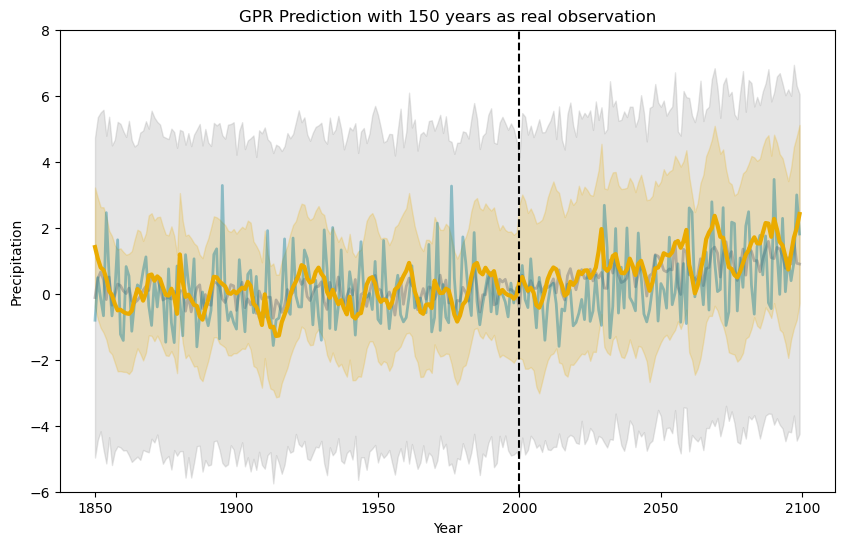

In [124]:
Nobs = 150
save_prior_posterior(year7, virtualobs7, prior_mu7, prior_cov7, post_mu7, post_cov7, '../poster/plot/result/poly_150.svg')

Optimization Progress:   0%|          | 0/30 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 1.2623276024142487, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -4382.495517259102
| 1         | -4.382e+0 | 1.306     | 1.262     | 0.9855    | 0.9046    | 0.1869    | 27.5      

Optimization Progress: 100%|██████████| 30/30 [00:37<00:00,  1.26s/it]

Received params: {'constant1': 1.0, 'constant2': 1.3907387252597707, 'constant3': 0.001, 'constant4': 0.001, 'constant5': 0.001, 'matern_length': 52.8195659473912, 'noise_level': 1e-06, 'nu': 2.5, 'period1': 7.0, 'period2': 27.0, 'period3': 31.0, 'rbf_length': 30.047155563796725, 'rq_alpha': 0.01, 'rq_ls': 88.02536024179032}
Total LML for current params: -4482.258888541298
| 80        | -4.482e+0 | 1.0       | 1.391     | 0.001     | 0.001     | 0.001     | 52.82     | 1e-06     | 2.5       | 7.0       | 27.0      | 31.0      | 30.05     | 0.01      | 88.03     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=0.01, length_scale=100) + 0.0316**2 * Matern(length_scale=46.7, nu=2.5) + 1**2 * RBF(length_scale=37.2) + WhiteKernel(noise_level=1e-06)


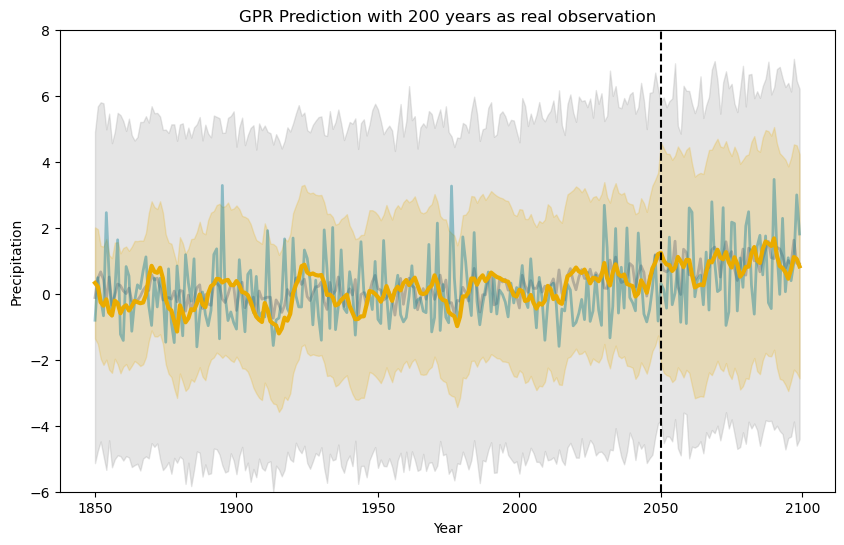

In [128]:
def polype3_rq_matern_rbf(best_params):
    custom_poly_kernel = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=[best_params['period1'], best_params['period2'], best_params['period3']])
    original_kernel = (
        C(best_params['constant2']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant3']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant4']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return custom_poly_kernel + original_kernel

pbounds = {
    'period1': (3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1e2),
    'matern_length': (1e0, 1e2),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1e-3, 10-2),
    'constant3': (1e-3, 1),
    'constant4': (1e-3, 1),
    'constant5': (1e-3, 1),
    'rbf_length': (1e-2, 1e2),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 1e2)
}

Nobs=200
year8, virtualobs8, prior_mu8, prior_cov8, post_mu8, post_cov8 = kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])

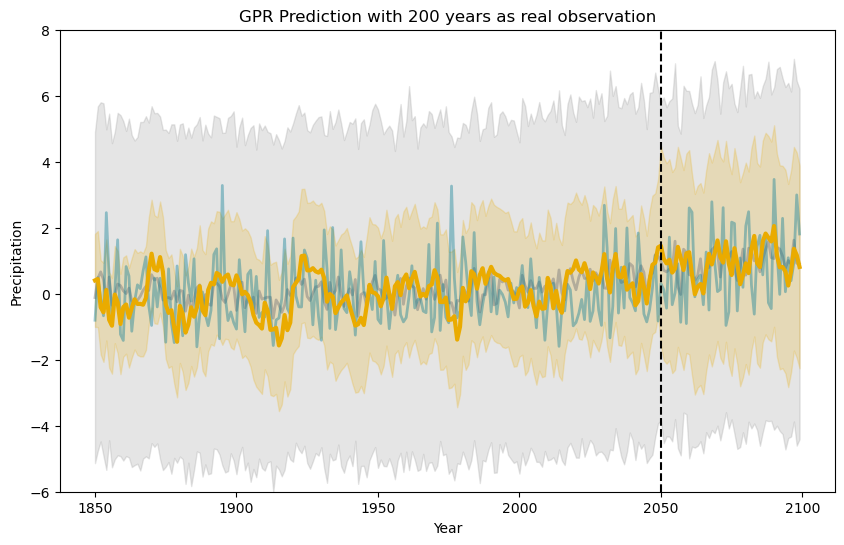

In [142]:
save_prior_posterior(year8, virtualobs8, prior_mu8, prior_cov8, post_mu8, post_cov8, '../poster/plot/result/poly_200.svg')

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -1223.5383571583475
| 1         | -1.224e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5    

Optimization Progress: 100%|██████████| 20/20 [00:06<00:00,  2.92it/s]

Received params: {'constant1': 1.0, 'constant2': 0.001, 'constant3': 0.001, 'constant4': 0.001, 'constant5': 0.001, 'matern_length': 7.882574767261431, 'noise_level': 1e-06, 'nu': 0.5, 'period1': 7.0, 'period2': 31.0, 'period3': 29.972181042834595, 'rbf_length': 90.14906970453531, 'rq_alpha': 25.104628678597553, 'rq_ls': 63.4502826032375}
Total LML for current params: -1188.079561033282
| 60        | -1.188e+0 | 1.0       | 0.001     | 0.001     | 0.001     | 0.001     | 7.883     | 1e-06     | 0.5       | 7.0       | 31.0      | 29.97     | 90.15     | 25.1      | 63.45     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.779**2 * RationalQuadratic(alpha=28.1, length_scale=59) + 0.0316**2 * Matern(length_scale=10.7, nu=0.5) + 0.0316**2 * RBF(length_scale=88.2) + WhiteKernel(noise_level=1e-06)


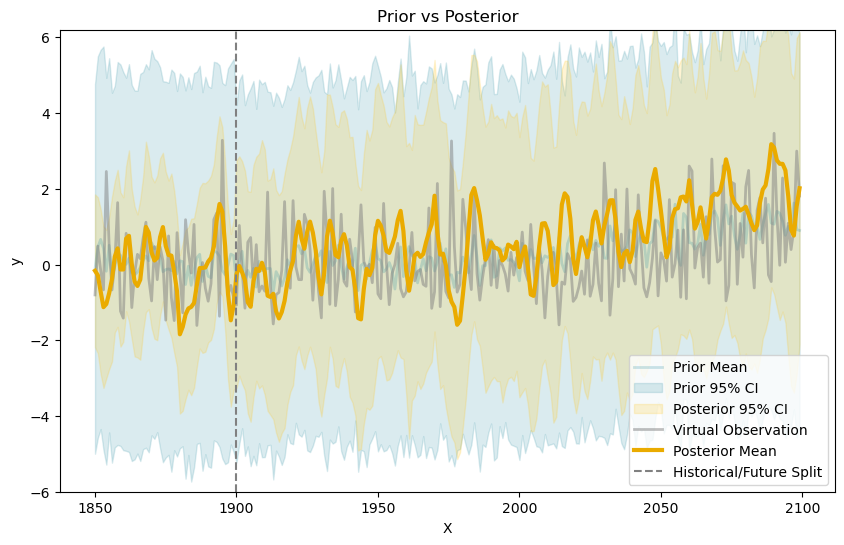

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -2246.174712578842
| 1         | -2.246e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5     

Optimization Progress: 100%|██████████| 20/20 [00:23<00:00,  1.15s/it]

Received params: {'constant1': 1.0, 'constant2': 0.001, 'constant3': 0.001, 'constant4': 0.001, 'constant5': 1.0, 'matern_length': 81.92528279132462, 'noise_level': 1.0, 'nu': 2.5, 'period1': 3.0, 'period2': 31.0, 'period3': 31.0, 'rbf_length': 77.00389035053422, 'rq_alpha': 25.188753151449614, 'rq_ls': 41.686926754047605}
Total LML for current params: -2181.8118244174916
| 60        | -2.182e+0 | 1.0       | 0.001     | 0.001     | 0.001     | 1.0       | 81.93     | 1.0       | 2.5       | 3.0       | 31.0      | 31.0      | 77.0      | 25.19     | 41.69     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=26.2, length_scale=39.9) + 0.0316**2 * Matern(length_scale=79.3, nu=0.5) + 0.0316**2 * RBF(length_scale=80.8) + WhiteKernel(noise_level=1)


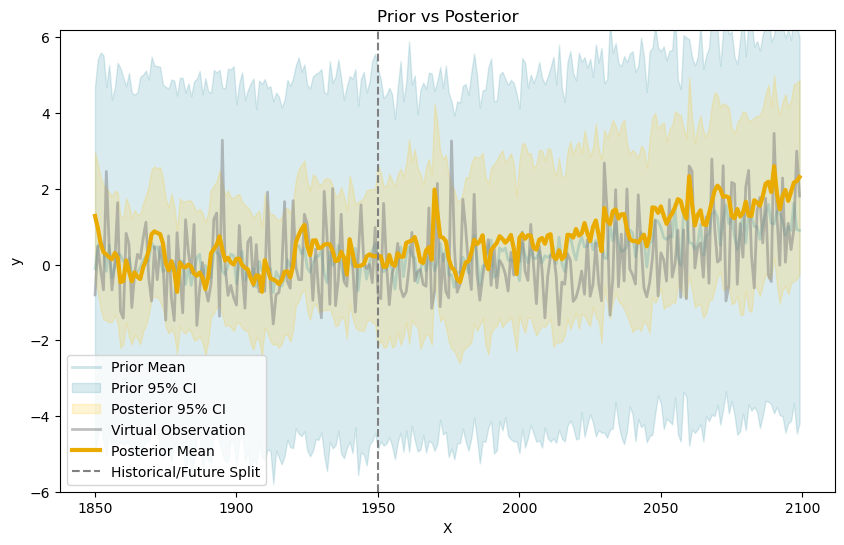

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -3295.0831812153897
| 1         | -3.295e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5    

Optimization Progress: 100%|██████████| 20/20 [00:30<00:00,  1.54s/it]

Received params: {'constant1': 1.0, 'constant2': 0.001, 'constant3': 0.001, 'constant4': 1.0, 'constant5': 0.001, 'matern_length': 18.908488569886256, 'noise_level': 1e-06, 'nu': 0.5, 'period1': 3.0, 'period2': 27.0, 'period3': 27.0, 'rbf_length': 75.68021103740581, 'rq_alpha': 42.77220560597539, 'rq_ls': 44.07490402749178}
Total LML for current params: -3206.462123188371
| 60        | -3.206e+0 | 1.0       | 0.001     | 0.001     | 1.0       | 0.001     | 18.91     | 1e-06     | 0.5       | 3.0       | 27.0      | 27.0      | 75.68     | 42.77     | 44.07     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=14.9, length_scale=54.1) + 0.0316**2 * Matern(length_scale=18.1, nu=2.5) + 0.331**2 * RBF(length_scale=84.8) + WhiteKernel(noise_level=0.0468)


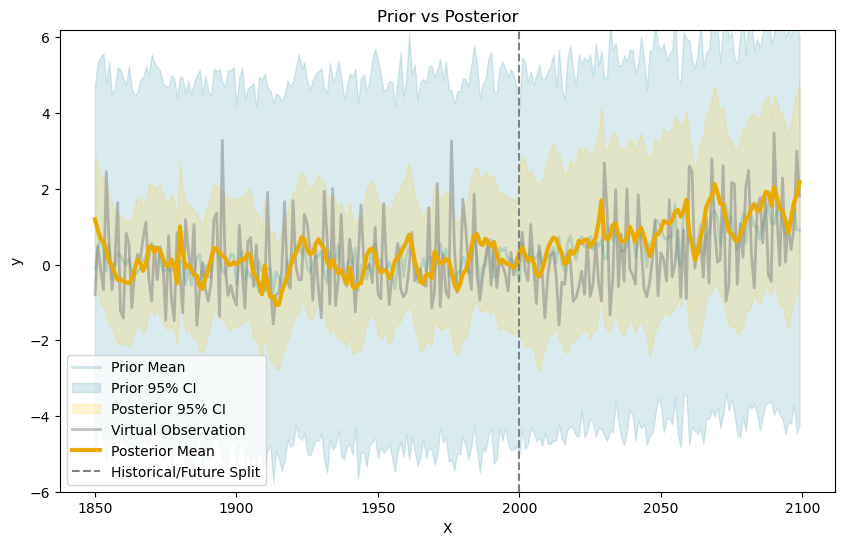

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 0.15852797534839788, 'constant3': 0.9855056230689695, 'constant4': 0.9045932330744885, 'constant5': 0.18689218440437394, 'matern_length': 27.50324192690301, 'noise_level': 0.33405182343722156, 'nu': 1.7891837418650491, 'period1': 4.005628963031626, 'period2': 29.540825549551798, 'period3': 29.319191115365317, 'rbf_length': 61.88493417206696, 'rq_alpha': 36.783534876423026, 'rq_ls': 25.82414756182109}
Total LML for current params: -4360.831849970716
| 1         | -4.361e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5     

Optimization Progress: 100%|██████████| 20/20 [00:24<00:00,  1.22s/it]

Received params: {'constant1': 1.0, 'constant2': 0.001, 'constant3': 0.001, 'constant4': 1.0, 'constant5': 1.0, 'matern_length': 24.93340064008168, 'noise_level': 1e-06, 'nu': 0.5, 'period1': 7.0, 'period2': 27.0, 'period3': 27.0, 'rbf_length': 90.9415209098241, 'rq_alpha': 23.21542617322728, 'rq_ls': 61.368552903316754}
Total LML for current params: -4305.7177191021
| 60        | -4.306e+0 | 1.0       | 0.001     | 0.001     | 1.0       | 1.0       | 24.93     | 1e-06     | 0.5       | 7.0       | 27.0      | 27.0      | 90.94     | 23.22     | 61.37     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 1**2 * RationalQuadratic(alpha=20.8, length_scale=62.5) + 0.0316**2 * Matern(length_scale=23.7, nu=0.5) + 1**2 * RBF(length_scale=91.2) + WhiteKernel(noise_level=0.525)


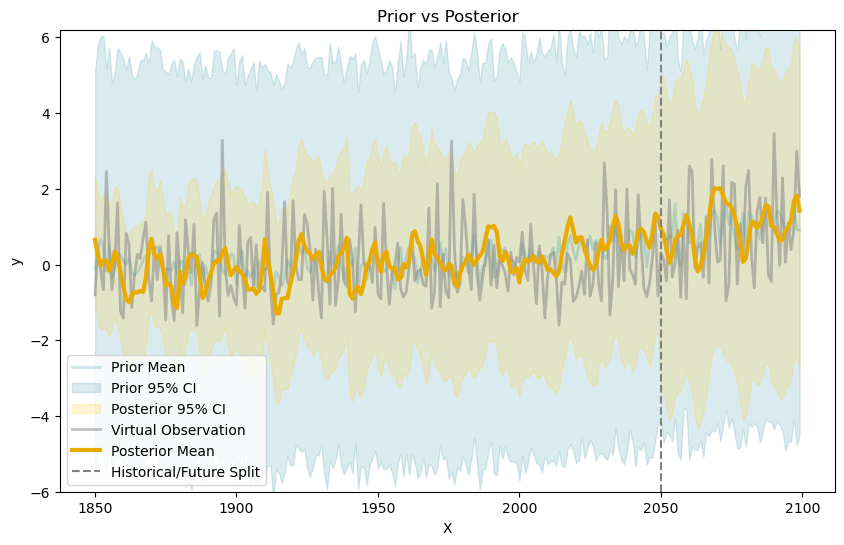

In [331]:
def polype3_rq_matern_rbf(best_params):
    custom_poly_kernel = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=[best_params['period1'], best_params['period2'], best_params['period3']])
    original_kernel = (
        C(best_params['constant2']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant3']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant4']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return custom_poly_kernel + original_kernel

pbounds = {
    'period1': (3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1e2),
    'matern_length': (1e0, 1e2),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1e-3, 1),
    'constant3': (1e-3, 1),
    'constant4': (1e-3, 1),
    'constant5': (1e-3, 1),
    'rbf_length': (1e-2, 1e2),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 1e2)
}

Nobs=50
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])
Nobs=100
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])
Nobs=150
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])
Nobs=200
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 1])

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | constant6 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 1.3153713220188146, 'constant3': 2.970982228366305, 'constant4': 0.45234436767184155, 'constant5': 0.09385305307085344, 'constant6': 0.1345870476921677, 'matern_length': 4.006460417395412, 'noise_level': 0.6445922263406536, 'nu': 1.0028144815158127, 'period1': 5.540825549551797, 'period2': 29.319191115365317, 'period3': 29.475244891371815, 'rbf_length': 3.684043538508511, 'rq_alpha': 0.2655856194239712, 'rq_ls': 1.9515583984141516}
Total LML for current params: -1154.8283992832698
| 1         | -1.155e+0 | 1.306     | 

Optimization Progress: 100%|██████████| 20/20 [00:11<00:00,  1.78it/s]

Received params: {'constant1': 1.0, 'constant2': 1.0, 'constant3': 1.0, 'constant4': 0.001, 'constant5': 0.001, 'constant6': 0.001, 'matern_length': 3.655954521318945, 'noise_level': 1e-06, 'nu': 0.5, 'period1': 3.0, 'period2': 27.0, 'period3': 27.0, 'rbf_length': 9.55985949691957, 'rq_alpha': 0.3765984632094854, 'rq_ls': 8.39316413001557}
Total LML for current params: -1126.291523397138
| 60        | -1.126e+0 | 1.0       | 1.0       | 1.0       | 0.001     | 0.001     | 0.001     | 3.656     | 1e-06     | 0.5       | 3.0       | 27.0      | 27.0      | 9.56      | 0.3766    | 8.393     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 1**2 * CustomPolynomialKernel() + 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=0.279, length_scale=10) + 0.0316**2 * Matern(length_scale=3.6, nu=0.5) + 0.0316**2 * RBF(length_scale=9.41) + WhiteKernel(noise_level=1e-06)


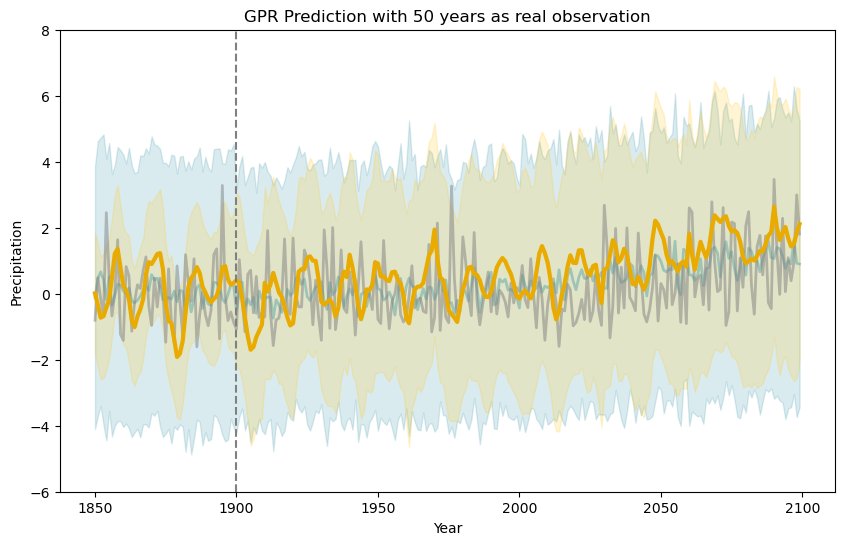

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | constant6 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 1.3153713220188146, 'constant3': 2.970982228366305, 'constant4': 0.45234436767184155, 'constant5': 0.09385305307085344, 'constant6': 0.1345870476921677, 'matern_length': 4.006460417395412, 'noise_level': 0.6445922263406536, 'nu': 1.0028144815158127, 'period1': 5.540825549551797, 'period2': 29.319191115365317, 'period3': 29.475244891371815, 'rbf_length': 3.684043538508511, 'rq_alpha': 0.2655856194239712, 'rq_ls': 1.9515583984141516}
Total LML for current params: -2192.221105328111
| 1         | -2.192e+0 | 1.306     | 1

Optimization Progress: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]

Received params: {'constant1': 1.0, 'constant2': 1.0, 'constant3': 1.0, 'constant4': 0.5, 'constant5': 0.001, 'constant6': 0.001, 'matern_length': 1.0, 'noise_level': 1e-06, 'nu': 2.5, 'period1': 3.0, 'period2': 31.0, 'period3': 31.0, 'rbf_length': 0.01, 'rq_alpha': 0.01, 'rq_ls': 10.0}
Total LML for current params: -2093.214048460377
| 60        | -2.093e+0 | 1.0       | 1.0       | 1.0       | 0.5       | 0.001     | 0.001     | 1.0       | 1e-06     | 2.5       | 3.0       | 31.0      | 31.0      | 0.01      | 0.01      | 10.0      |
Best kernel is: 1**2 * CustomPolynomialKernel() + 1**2 * CustomPolynomialKernel() + 1**2 * CustomPolynomialKernel() + 0.707**2 * RationalQuadratic(alpha=0.01, length_scale=10) + 0.0316**2 * Matern(length_scale=1, nu=2.5) + 0.0316**2 * RBF(length_scale=0.01) + WhiteKernel(noise_level=1e-06)


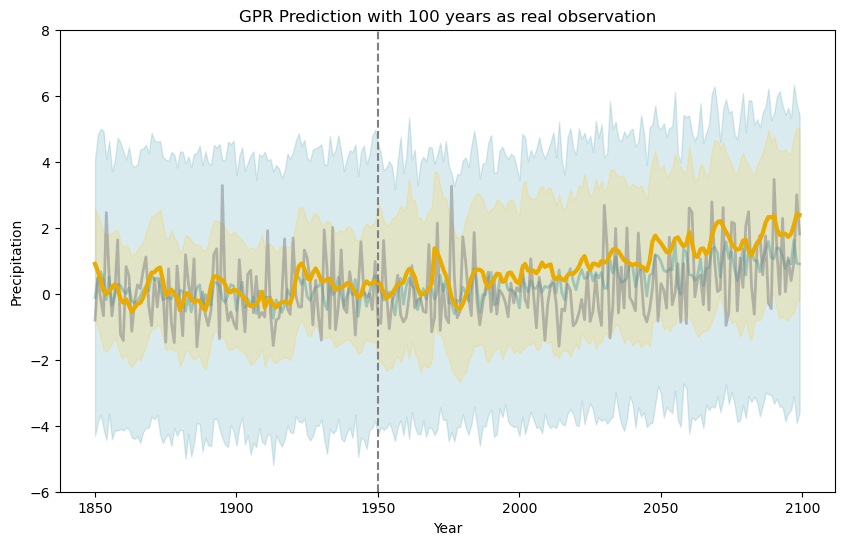

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | constant6 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 1.3153713220188146, 'constant3': 2.970982228366305, 'constant4': 0.45234436767184155, 'constant5': 0.09385305307085344, 'constant6': 0.1345870476921677, 'matern_length': 4.006460417395412, 'noise_level': 0.6445922263406536, 'nu': 1.0028144815158127, 'period1': 5.540825549551797, 'period2': 29.319191115365317, 'period3': 29.475244891371815, 'rbf_length': 3.684043538508511, 'rq_alpha': 0.2655856194239712, 'rq_ls': 1.9515583984141516}
Total LML for current params: -3218.057700539688
| 1         | -3.218e+0 | 1.306     | 1

Optimization Progress: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]

Total LML for current params: -3150.493675143841
| 60        | -3.15e+03 | 1.0       | 1.0       | 1.804     | 0.001     | 0.001     | 0.001     | 3.212     | 1e-06     | 0.6762    | 4.798     | 28.18     | 27.72     | 5.974     | 0.01      | 6.103     |
Best kernel is: 1**2 * CustomPolynomialKernel() + 1**2 * CustomPolynomialKernel() + 1.34**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=0.01, length_scale=6.1) + 0.0316**2 * Matern(length_scale=3.21, nu=0.676) + 0.0316**2 * RBF(length_scale=5.97) + WhiteKernel(noise_level=1e-06)


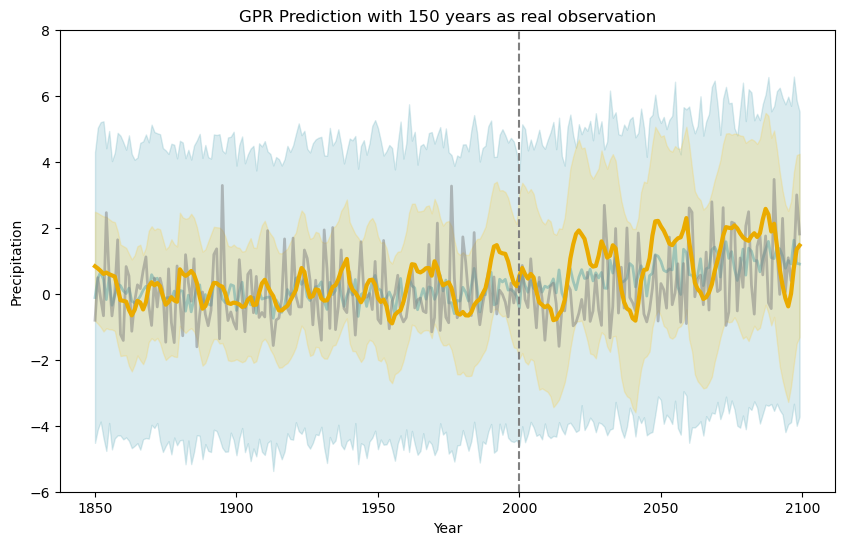

Optimization Progress:   0%|          | 0/20 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | constant6 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Received params: {'constant1': 1.3061083975322938, 'constant2': 1.3153713220188146, 'constant3': 2.970982228366305, 'constant4': 0.45234436767184155, 'constant5': 0.09385305307085344, 'constant6': 0.1345870476921677, 'matern_length': 4.006460417395412, 'noise_level': 0.6445922263406536, 'nu': 1.0028144815158127, 'period1': 5.540825549551797, 'period2': 29.319191115365317, 'period3': 29.475244891371815, 'rbf_length': 3.684043538508511, 'rq_alpha': 0.2655856194239712, 'rq_ls': 1.9515583984141516}
Total LML for current params: -4292.903665453067
| 1         | -4.293e+0 | 1.306     | 1

Optimization Progress: 100%|██████████| 20/20 [00:20<00:00,  1.03s/it]

Total LML for current params: -4271.0142556236915
| 60        | -4.271e+0 | 1.467     | 1.533     | 2.132     | 0.07403   | 0.03832   | 0.01093   | 3.365     | 0.2138    | 2.477     | 4.47      | 28.75     | 28.25     | 5.562     | 0.7217    | 6.941     |
Best kernel is: 1.45**2 * CustomPolynomialKernel() + 1.39**2 * CustomPolynomialKernel() + 1.39**2 * CustomPolynomialKernel() + 0.536**2 * RationalQuadratic(alpha=0.112, length_scale=3.39) + 0.363**2 * Matern(length_scale=7.93, nu=0.815) + 0.414**2 * RBF(length_scale=6.65) + WhiteKernel(noise_level=0.54)


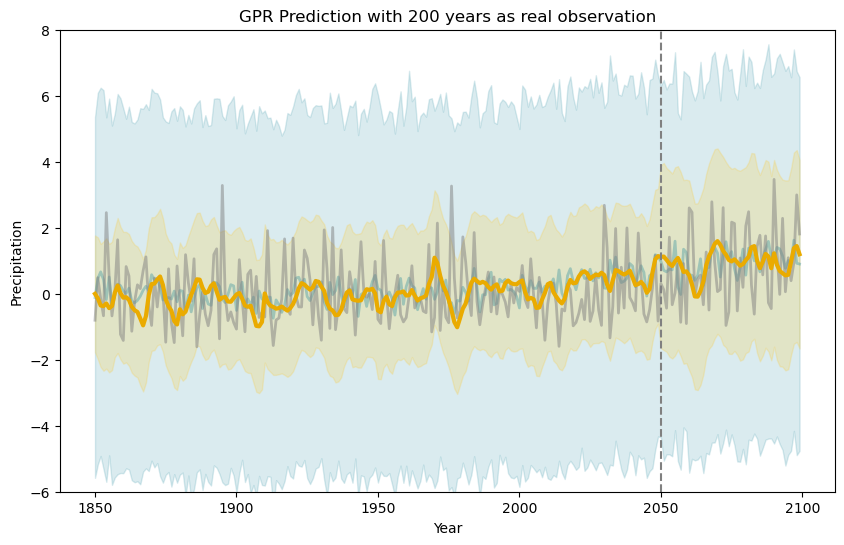

In [336]:
def polype3_rq_matern_rbf_true(best_params):
    custom_poly_kernel1 = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=best_params['period1'])
    custom_poly_kernel2 = C(best_params['constant2']) * CustomPolynomialKernel(degree=2, periods=best_params['period2'])
    custom_poly_kernel3 = C(best_params['constant3']) * CustomPolynomialKernel(degree=2, periods=best_params['period3'])
    
    original_kernel = (
        C(best_params['constant4']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant5']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant6']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    
    return custom_poly_kernel1 + custom_poly_kernel2 + custom_poly_kernel3 + original_kernel

pbounds = {
    'period1':(3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1),
    'matern_length': (1e0, 10),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1, 3),
    'constant3': (1, 3),
    'constant4': (1e-3, 0.5),
    'constant5': (1e-3, 0.5),
    'constant6': (1e-3, 0.5),
    'rbf_length': (1e-2, 10),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 10)
}

Nobs=50
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf_true, rainfall_yearly_test.iloc[:, 1])
Nobs=100
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf_true, rainfall_yearly_test.iloc[:, 1])
Nobs=150
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf_true, rainfall_yearly_test.iloc[:, 1])
Nobs=200
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf_true, rainfall_yearly_test.iloc[:, 1])


## original

Optimization Progress:   0%|          | 0/1 [00:00<?, ?it/s]

|   iter    |  target   | consta... | noise_... | rbf_le... |
-------------------------------------------------------------
Received params: {'constant_rbf': 0.15390114456738074, 'noise_level': 0.15768650332374629, 'rbf_length': 9.855056230689694}
Total LML for current params: -1007.8560756594468
| 1         | -1.008e+0 | 0.1539    | 0.1577    | 9.855     |
Received params: {'constant_rbf': 0.9045932330744885, 'noise_level': 0.1860790765887783, 'rbf_length': 2.684418048987485}
Total LML for current params: -1040.3091752737782
| 2         | -1.04e+03 | 0.9046    | 0.1861    | 2.684     |
Received params: {'constant_rbf': 0.33471710633089075, 'noise_level': 0.6445922263406536, 'rbf_length': 2.521558335171484}
Total LML for current params: -1011.8295734954564
| 3         | -1.012e+0 | 0.3347    | 0.6446    | 2.522     |
Received params: {'constant_rbf': 0.6355711810005613, 'noise_level': 0.5797981990435505, 'rbf_length': 6.19192411620111}
Total LML for current params: -1029.3570865977397


Optimization Progress: 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

Total LML for current params: -1036.5657312118499
| 10        | -1.037e+0 | 0.9683    | 0.9862    | 8.2       |
Received params: {'constant_rbf': 0.15309930222742474, 'noise_level': 0.15999566169595203, 'rbf_length': 9.855096623113507}
Total LML for current params: -1007.8141184544347
| 11        | -1.008e+0 | 0.1531    | 0.16      | 9.855     |
Best kernel is: 0.391**2 * RBF(length_scale=9.86) + WhiteKernel(noise_level=0.16)


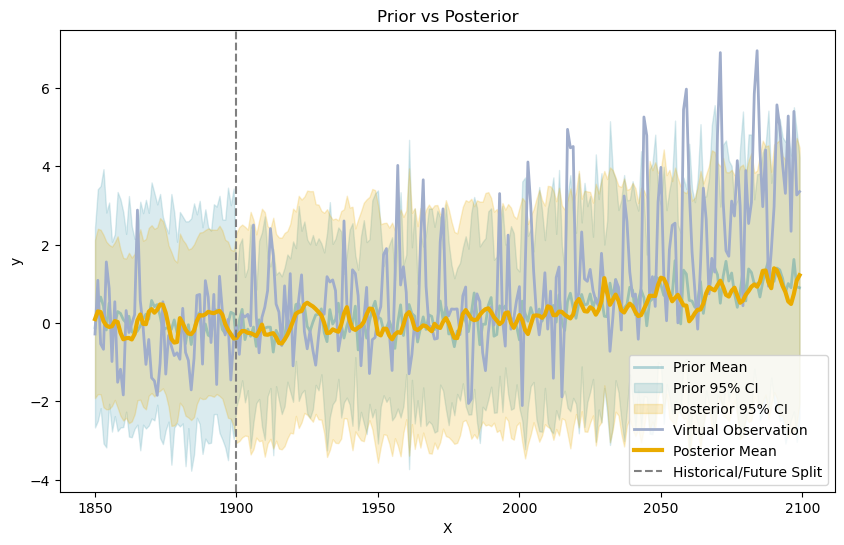

Optimization Progress:   0%|          | 0/1 [00:00<?, ?it/s]

|   iter    |  target   | consta... | noise_... | rbf_le... |
-------------------------------------------------------------
Received params: {'constant_rbf': 0.15390114456738074, 'noise_level': 0.15768650332374629, 'rbf_length': 9.855056230689694}
Total LML for current params: -1962.440834952631
| 1         | -1.962e+0 | 0.1539    | 0.1577    | 9.855     |
Received params: {'constant_rbf': 0.9045932330744885, 'noise_level': 0.1860790765887783, 'rbf_length': 2.684418048987485}
Total LML for current params: -2039.6434772260118
| 2         | -2.04e+03 | 0.9046    | 0.1861    | 2.684     |
Received params: {'constant_rbf': 0.33471710633089075, 'noise_level': 0.6445922263406536, 'rbf_length': 2.521558335171484}
Total LML for current params: -1976.7640299902157
| 3         | -1.977e+0 | 0.3347    | 0.6446    | 2.522     |
Received params: {'constant_rbf': 0.6355711810005613, 'noise_level': 0.5797981990435505, 'rbf_length': 6.19192411620111}
Total LML for current params: -2006.81513388589
| 4

Optimization Progress: 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

Total LML for current params: -1984.5558977526605
| 8         | -1.985e+0 | 0.3856    | 0.0801    | 8.077     |
Received params: {'constant_rbf': 0.8116625405244087, 'noise_level': 0.05082998737984475, 'rbf_length': 5.946575257064406}
Total LML for current params: -2019.8643261953239
| 9         | -2.02e+03 | 0.8117    | 0.05083   | 5.947     |
Received params: {'constant_rbf': 0.9682941207409049, 'noise_level': 0.9862172640052959, 'rbf_length': 8.199781109327107}
Total LML for current params: -2020.4040290619716
| 10        | -2.02e+03 | 0.9683    | 0.9862    | 8.2       |
Received params: {'constant_rbf': 0.7918527249246518, 'noise_level': 0.06339916112161216, 'rbf_length': 4.097435503824233}
Total LML for current params: -2025.8142160493942
| 11        | -2.026e+0 | 0.7919    | 0.0634    | 4.097     |
Best kernel is: 0.392**2 * RBF(length_scale=9.86) + WhiteKernel(noise_level=0.158)


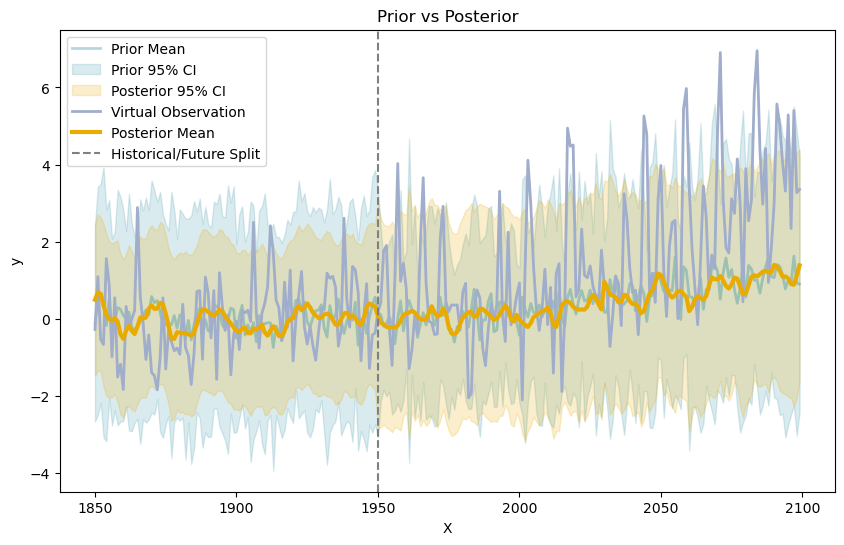

Optimization Progress:   0%|          | 0/1 [00:00<?, ?it/s]

|   iter    |  target   | consta... | noise_... | rbf_le... |
-------------------------------------------------------------
Received params: {'constant_rbf': 0.15390114456738074, 'noise_level': 0.15768650332374629, 'rbf_length': 9.855056230689694}
Total LML for current params: -2955.828902931748
| 1         | -2.956e+0 | 0.1539    | 0.1577    | 9.855     |
Received params: {'constant_rbf': 0.9045932330744885, 'noise_level': 0.1860790765887783, 'rbf_length': 2.684418048987485}
Total LML for current params: -3064.712556460301
| 2         | -3.065e+0 | 0.9046    | 0.1861    | 2.684     |
Received params: {'constant_rbf': 0.33471710633089075, 'noise_level': 0.6445922263406536, 'rbf_length': 2.521558335171484}
Total LML for current params: -2972.9596771641864
| 3         | -2.973e+0 | 0.3347    | 0.6446    | 2.522     |
Received params: {'constant_rbf': 0.6355711810005613, 'noise_level': 0.5797981990435505, 'rbf_length': 6.19192411620111}
Total LML for current params: -3024.649306999726
| 4

Optimization Progress: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

Total LML for current params: -3045.8265091050603
| 10        | -3.046e+0 | 0.9683    | 0.9862    | 8.2       |
Received params: {'constant_rbf': 0.13364215074808827, 'noise_level': 0.15633662878832272, 'rbf_length': 9.851997482281584}
Total LML for current params: -2952.6588595355124
| 11        | -2.953e+0 | 0.1336    | 0.1563    | 9.852     |
Best kernel is: 0.366**2 * RBF(length_scale=9.85) + WhiteKernel(noise_level=0.156)


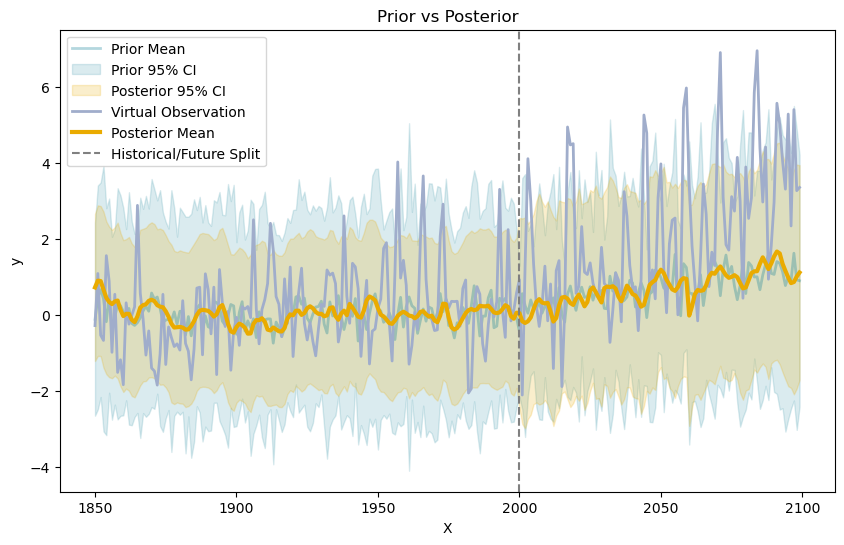

Optimization Progress:   0%|          | 0/1 [00:00<?, ?it/s]

|   iter    |  target   | consta... | noise_... | rbf_le... |
-------------------------------------------------------------
Received params: {'constant_rbf': 0.15390114456738074, 'noise_level': 0.15768650332374629, 'rbf_length': 9.855056230689694}
Total LML for current params: -4025.344362609314
| 1         | -4.025e+0 | 0.1539    | 0.1577    | 9.855     |
Received params: {'constant_rbf': 0.9045932330744885, 'noise_level': 0.1860790765887783, 'rbf_length': 2.684418048987485}
Total LML for current params: -4153.511646517282
| 2         | -4.154e+0 | 0.9046    | 0.1861    | 2.684     |
Received params: {'constant_rbf': 0.33471710633089075, 'noise_level': 0.6445922263406536, 'rbf_length': 2.521558335171484}
Total LML for current params: -4054.3655040552667
| 3         | -4.054e+0 | 0.3347    | 0.6446    | 2.522     |
Received params: {'constant_rbf': 0.6355711810005613, 'noise_level': 0.5797981990435505, 'rbf_length': 6.19192411620111}
Total LML for current params: -4097.945568752222
| 4

Optimization Progress: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

Total LML for current params: -4055.404437396603
| 8         | -4.055e+0 | 0.3856    | 0.0801    | 8.077     |
Received params: {'constant_rbf': 0.8116625405244087, 'noise_level': 0.05082998737984475, 'rbf_length': 5.946575257064406}
Total LML for current params: -4120.924672024595
| 9         | -4.121e+0 | 0.8117    | 0.05083   | 5.947     |
Received params: {'constant_rbf': 0.9682941207409049, 'noise_level': 0.9862172640052959, 'rbf_length': 8.199781109327107}
Total LML for current params: -4115.550052972009
| 10        | -4.116e+0 | 0.9683    | 0.9862    | 8.2       |
Received params: {'constant_rbf': 0.7918527249246518, 'noise_level': 0.06339916112161216, 'rbf_length': 4.097435503824233}
Total LML for current params: -4130.645659603635
| 11        | -4.131e+0 | 0.7919    | 0.0634    | 4.097     |


Optimization Progress: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Best kernel is: 0.392**2 * RBF(length_scale=9.86) + WhiteKernel(noise_level=0.158)


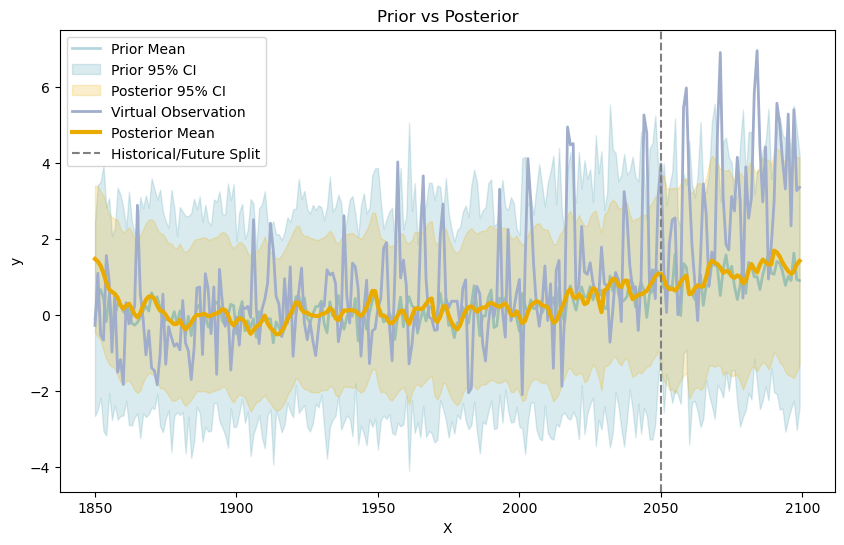

In [253]:
def rbf(best_params):
    combined_kernel = (
        C(best_params['constant_rbf']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return combined_kernel

pbounds = {
    'rbf_length': (1e-2, 10), 
    'noise_level': (1e-6, 1),   
    'constant_rbf': (1e-3, 1),  
}

Nobs=50
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbf, rainfall_yearly_test.iloc[:, 3])
Nobs=100
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbf, rainfall_yearly_test.iloc[:, 3])
Nobs=150
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbf, rainfall_yearly_test.iloc[:, 3])
Nobs=200
kernel_tune(mod_ids, Nobs, rainfall_yearly, pbounds, rbf, rainfall_yearly_test.iloc[:, 3])